# Alcance 1: Metodología para la Estimación y Modelamiento de la DNI, la DHI y la POA a partir de la GHI

# Alcance 3: Modelo que Relaciona Recurso y Potencia en Plantas Solares Fotovoltaicas 

---

## Modelamiento de Planta El Paso Solar de Enel Green Power

Universidad de los Andes  y Consejo Nacional de Operación.

Agosto, 2021.

---

## Novedades
1. Planta fotovoltaica de escala utility.
2. Resolución minutal de los datos.
3. Incorporación de seguidores en el modelado computacional.

---

## TABLA DE CONTENIDO

### Sección 1: Información Geográfica

### Sección 2: Base de Datos

### Sección 3: Comportamiento Irradiancia Mensual
- 3.1. irrad_range: Función para extraer un dataframe de irradiancia para un rango de tiempo
- 3.2. irrad_analysis: Función para extraer máximo y mínimo de los df dados por irrad_range
- 3.3. Comportamiento GHI
- 3.4. Comportamiento DHI
- 3.5. Correlación Irradiancia POA (CU #)

### Sección 4: Datos Meteorológicos
- 4.1. Posición Solar
- 4.2. Airmass
- 4.3. DNI Extraterrestre

### Sección 5: Modelo de Descomposición + Transposición Propuesto
- 5.1. Descomposición: DISC
- 5.2. Transposición: Perez-Ineichen 1990
    - 5.2.1. Seguidor de Un Eje (Single-Axis Tracker)
    - 5.2.2. Irradiancia POA
    - 5.2.3. Irradiancia DHI 
    - 5.2.4. Irradiancia POA (Julio 2020) 
    - 5.2.5. Irradiancia POA (Datos Medidos)
- 5.3. Transposición: Todos los Modelos

### Sección 6: Datos Año Típico Meteorológico (TMY) El Paso
- 6.1. Comparación Medición vs. TMY
- 6.2. Modelo de Descomposición + Tranposición Propuesto
    - 6.2.1. Descomposición: DISC
    - 6.2.2. Transposición: Perez-Ineichen 1990
    
### Sección 7: Otros Modelos de Descomposición + Transposición
- 7.1. Erbs + Modelos Tranposición
- 7.2. DIRINT + Modelos Tranposición
- 7.3. DIRINDEX + Modelos Tranposición
- 7.4. Métricas Estadísticas Modelos Descomposición + Perez-Ineichen 1990 (CU 1)

### Sección 8: DISC + Perez-Ineichen 1990: Resolución 5-min
- 8.1. Resampleo 1-min a 5-min
- 8.2. Datos Meteorológicos
- 8.3. Descomposición: DISC
- 8.4. Transposición: Perez-Ineichen 1990
- 8.5. Irradiancia POA
- 8.6. Irradiancia DHI

### Sección 9: DISC + Perez-Ineichen 1990: Resolución 10-min
- 9.1. Resampleo 1-min a 10-min
- 9.2. Datos Meteorológicos
- 9.3. Descomposición: DISC
- 9.4. Transposición: Perez-Ineichen 1990
- 9.5. Irradiancia POA
- 9.6. Irradiancia DHI 

### Sección 10: DISC + Perez-Ineichen 1990: Resolución 60-min
- 10.1. Resampleo 1-min a 60-min
- 10.2. Datos Meteorológicos
- 10.3. Descomposición: DISC
- 10.4. Transposición: Perez-Ineichen 1990
- 10.5. Irradiancia POA
- 10.6. Irradiancia DHI 

### Sección 11: Configuración del Sistema
- 11.1. Datos de Potencia
- 11.2. Inversores
- 11.3. Módulos FV
- 11.4. Configuración de Arreglos FV

### Sección 12: Modelado de Producción con PVlib: Datos Medidos
- 12.1. Temperatura de las Celdas
- 12.2. Producción DC: Voltaje, Corriente y Potencia
- 12.3. Pérdidas
- 12.4. Potencia AC
- 12.5. Energía Diaria, Semanal y Mensual
- 12.6. Simulación Modelo (Resolución 1-min)
    - 12.6.1. Potencia AC 
    - 12.6.2. Energía Diaria
    - 12.6.3. Energía Semanal
    - 12.6.4. Energía Mensual
    - 12.6.5. Relación Recurso-Potencia
- 12.7. Simulación Modelo (Resoluciones 5-, 10- y 60-min)
    - 12.7.1. Potencia AC
    - 12.7.2. Energía Diaria
    - 12.7.3. Energía Semanal
    - 12.7.4. Energía Mensual

### Sección 13: Modelado de Producción con PVlib: Datos Descomposición + Transposición
- 13.1. Simulación Modelo
    - 13.1.1. Potencia AC 
    - 13.1.2. Energía Diaria
    - 13.1.3. Energía Semanal
    - 13.1.4. Energía Mensual 
    - 13.1.5. Relación Recurso-Potencia
- 13.2. Simulación Modelo (Resoluciones 5-, 10- y 60-min)
    - 13.2.1. Potencia AC
    - 13.2.2. Energía Diaria
    - 13.2.3. Energía Semanal
    - 13.2.4. Energía Mensual
    
### Sección 14: Conclusiones

___

In [1]:
#Configuración
%matplotlib inline
import matplotlib.pyplot as plt

#Built-in Python Modules
import datetime
import inspect
import os
import csv
import math
import glob
import random
import warnings
from calendar import monthrange
warnings.filterwarnings(action='ignore')

#Complementos de Python
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
from matplotlib import dates as mpl_dates
from scipy import stats
from sklearn.metrics import mean_squared_error, r2_score

#MMódulos Sandia PVLIB-Python
import pvlib
from pvlib import solarposition, irradiance, atmosphere, pvsystem
from pvlib.location import Location
from pvlib.pvsystem import PVSystem, retrieve_sam

## 1. Información Geográfica

In [3]:
#Coordenadas Geográficas (Planta FV El Paso, El Paso, Cesar, Colombia)
latitude = 9.789103       #Latitud Google Maps
longitude = -73.722451    #Longitud Google Maps
tz = 'America/Bogota'     #Huso Horario UTC-5:00 (America\Bogota) según Minicipio.com.co
altitude = 50             #Cesar.gov.co (41 Meteoblue, 36 Wikipedia, 23 Municipio.com.co)

#Ubicación Geográfica
location = pvlib.location.Location(latitude, longitude, tz, altitude)

## 2. Base de Datos

In [5]:
#Grab Excel Files Only
pattern = './EL_PASO/II_semestre_2020/*/*.xlsx'

#Save All File Matches: xlsx_files
xlsx_files = glob.glob(pattern)
xlsx_files.sort()

#Create an empty list: frames
frames = []

#Iterate Over xlsx_files
for filename in xlsx_files:
    #METEOST
    names = ['Datetime', 'temp_air', 'pressure', 'humidity', 'wind_direction', 'wind_speed', 'ghi_2', 'ghi', 'dhi', 'rain']
    columns = [1, 2, 3, 4, 5, 6, 8, 9, 10, 11]
    
    df = pd.read_excel(filename, sheet_name=1, header=10, names=names, usecols=columns, skiprows=1)
    df_meteost = df.set_index('Datetime')
    df_meteost = df_meteost[:-1]
    
    #Pyranometer
    names = ['Datetime', 'poa1', 'poa2', 'poa3', 'poa4', 'poa5', 'poa6', 'poa7', 'poa8', 'poa9', 'poa10', 'poa11', 'poa12']
    columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    df = pd.read_excel(filename, sheet_name=0, header=5, names=names, usecols=columns, skiprows=1)
    df_pyranometer = df.set_index('Datetime')
    
    #Complete Dataframe
    #df_full = pd.merge(df_meteost, df_pyranometer, on=['Datetime'])
    df_full = pd.concat([df_meteost, df_pyranometer], axis=1)

    #Append df to Frames
    frames.append(df_full)

#Concatenate Frames into Dataframe
#elpasoDB = pd.concat(frames).drop_duplicates()
elpasoDB = pd.concat(frames)
#elpasoDB = elpasoDB.sort_index()
elpasoDB = elpasoDB.fillna(0)
elpasoDB = elpasoDB.tz_localize(tz)

elpasoDB['poa_mean'] = elpasoDB[elpasoDB.columns[9:21]].mean(axis=1)

elpasoDB.loc[(elpasoDB.index.hour < 6) | (elpasoDB.index.hour > 18), 'ghi'] = 0 #Filtro datos hormiga

elpasoDB.head()

,temp_air,pressure,humidity,wind_direction,wind_speed,ghi_2,ghi,dhi,rain,poa1,...,poa4,poa5,poa6,poa7,poa8,poa9,poa10,poa11,poa12,poa_mean
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-06-01 00:00:00-05:00,25.333221,1006.132629,94.191826,232.892944,0.315409,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:01:00-05:00,25.333221,1006.044922,94.203514,279.992035,0.315409,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:02:00-05:00,25.298614,1006.132629,94.199608,226.395050,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:03:00-05:00,25.298614,1006.132629,94.199608,251.137543,1.196831,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:04:00-05:00,25.270233,1006.044922,94.078758,296.019226,0.722219,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 3. Comportamiento Irradiancia Mensual

<span style='color:Crimson'> **Nota:** Las funciones irrad_range e irrad_analysis pueden tomarse mucho tiempo en corren (1 hora, aproximadamente). </span>

In [6]:
'''
Common plots set-up function.
'''
def plot_specs(title, ylabel, xlabel, rot, ylim_min, ylim_max, xlim_min, xlim_max, loc):
    plt.rc('font', family='Helvetica')
    plt.rcParams['axes.axisbelow'] = True;
    
    plt.title(title, fontname="Helvetica", fontsize=15);
    plt.ylabel(ylabel, fontname="Helvetica", fontsize=13);
    plt.xlabel(xlabel, fontname="Helvetica", fontsize=13);
    
    plt.tick_params(direction='out', length=5, width=0.75, grid_alpha=0.3)
    plt.xticks(rotation=rot)
    plt.ylim(ylim_min, ylim_max)
    plt.xlim(xlim_min, xlim_max)
    plt.grid(True);
    plt.legend(loc=loc, fontsize=9);
    plt.tight_layout;
    
'''
Statistic Metrics
'''
def median_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.median(np.abs((y_true - y_pred) / y_true)) * 100

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

list_r2 = []
list_rmse = []
list_mape = []

def metrics(r2, measured, modeled, store):
    print('R2: ', r2.round(4))

    metrics_df = pd.DataFrame({'measured': measured, 
                               'modeled': modeled})

    y_true = metrics_df.measured
    y_pred = metrics_df.modeled

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requires to filter the data when y_true=0 --> (y_true - y_pred)/y_true
    '''
    metrics_df = metrics_df.loc[(metrics_df.index.hour >= 7) & (metrics_df.index.hour <= 17) & (metrics_df.measured != 0)]

    y_true = metrics_df.measured
    y_pred = metrics_df.modeled

    mape = median_absolute_percentage_error(y_true=y_true, y_pred=y_pred)
    print('MAPE: ', np.round(mape, 2))
    
    if store == True:
        list_r2.append(r_value)
        list_rmse.append(rmse)
        list_mape.append(mape)

### 3.1. irrad_range: Función para extraer un dataframe de irradiancia para un rango de tiempo

In [5]:
'''
irrad_range function extracts from the indicated dataframe 
those data included in the stipulated month and year.
'''
#Month Numeration
months_key = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
              'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}

#Dictionary to save the dataframes from the function
data_dict = dict()

def irrad_range(year, month, dataframe):
    data = pd.DataFrame()
    
    #Extract data by year and month
    data = dataframe.loc[(dataframe.index.year == year) & (dataframe.index.month == months_key[month])]
    
    if data.empty:
        print('{}-{} does not exist in the database. Stored as None.'.format(month, year))
        data_dict['{}{}'.format(month, year)] = None
        
    if not data.empty:
        #Create an 'Index' column for analysis purposes
        data['Index'] = range(0, len(data))    

        #Changing numerical-ordered index to datetime index
        data.set_index(data.index, inplace=True)
        data.drop(['Index'], axis=1, inplace=True)

        data_dict['{}{}'.format(month, year)] = data
    
    return(data_dict)

### 3.2. irrad_analysis: Función para extraer máximo y mínimo de los df dados por irrad_range <span style='color:White'>code:1</span>

In [6]:
'''
Plots set-up function.
'''
def plot_setup(setup, legend):
    if setup == True:
        hor = 7
        ver = 4
        plt.figure(figsize=(hor,ver))

        plt.tick_params(direction='in', length=5, width=0.75, grid_alpha=0.3)
        plt.xticks(rotation=0)
        plt.grid(True);
        plt.tight_layout;
    if legend == True:
        plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);
    else:
        None

In [7]:
'''
irrad_analysis function performs a statistical analysis in order
to extract max. and min. values for each data point.
'''

#Dictionary to save the dataframes from the function
analysis_dict = dict()
bootstrap_dict = dict() #Dictionary for Method 2.2: Bootstrap
skycond_dict = dict()
temp_skycond = dict()

def irrad_analysis(year, month, dictionary, title, plotall, which_irrad):
    #Array list to store daily irradiance values from irrad_range
    irrad = []
    irrads = []
    
    #Calling the data from irrad_range dictionary previously created
    data = dictionary['{}{}'.format(month, year)]
    
    if data is None:
        print('The dataframe is empty.')
        #analysis_dict['{}{}'.format(month, year)] = None
    
    if data is not None:
        #Extracting the days from the data from irrad_range dictionary
        days = data.index.day.unique()

        #Extract time to set the plot xlabel
        times = []
        for i in range(0, len(data)):
            day = 1
            if data.index.day.values[i] == day:
                hour = data.index[i].hour
                minute = data.index[i].minute

                if minute < 10:
                    time_format = '{}:0{}'.format(hour, minute)
                else:    
                    time_format = '{}:{}'.format(hour, minute)
                times.append(time_format)

        #Plot set-up
        plot_setup(setup=True, legend=False)

        #Loop to extract all daily irradiance values
        for i in days:
            '''
            Data analysis:
            1. Extraction of daily dataframes from data_dict (irrad_range function) according to the SC
            2. Extraction of irradiance values from above step.
            3. Statistical analysis for each data-point (time) for all days of the month selected (Step 1 to 4)
            '''
            data_daily = data.loc[data.index.day == i]

            '''
            1. Complete analysis: all days within the month
            '''
            irrad.append(data_daily[which_irrad].values)   

            #Step 1: Create an identical irrad dataframe to work on and set time as column names
            step1 = pd.DataFrame(irrad)
            step1.columns = times

            #Step 2: Description of all data-points for the anaylized days
            step2 = step1.describe()

            #Step 3: Transposition of dataframe (Setting timestamps as index and days as column names)
            step3 = step2.transpose()

            #Step 4: Save the analysis in analysis_dict
            analysis_dict['{}{}'.format(month, year)] = step3

            '''
            Plot of the statistical analysis done
            '''
            #Plot
            if plotall != False:
                plt.plot(irrad[i-1], alpha=0.1, linewidth=0.5, linestyle='--', marker='.', ms=0.8, fillstyle='none')

                if i==days[-1]:
                    plt.fill_between(x=np.arange(len(irrad[i-1])), 
                                     y1=step3['max'], 
                                     y2=step3['min'], 
                                     color='whitesmoke', alpha=0.35, label='Range')

                    step3['max'].plot(color='#1580E4', marker='.', linestyle='')
                    step3['mean'].plot(color='#2DBD07', marker='.', linestyle='')
                    step3['min'].plot(color='coral', marker='.', linestyle='')

                    plt.title('Comportamiento {} ({}-{})'.format(title, month, year), fontname='Helvetica Neue', fontsize=15);
                    plt.ylabel('Irradiancia, $W/m^2$', fontname='Helvetica Neue', fontsize=13);
                    plt.xlabel('Tiempo', fontname='Helvetica Neue', fontsize=13);

                    plt.xlim(0, len(irrad[i-1]))
                    plt.ylim(0, None)
                    plt.grid(True)
                    plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);
                    
                    if plotall == False:
                        plt.close()
            
    return(analysis_dict)

### 3.3. Comportamiento GHI

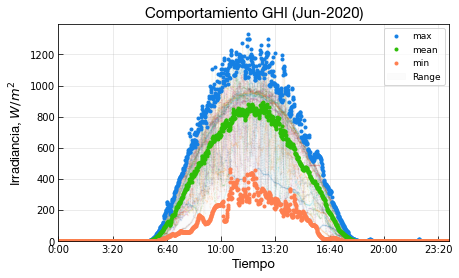

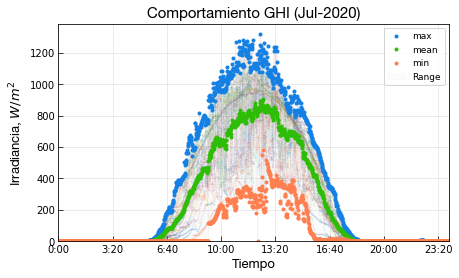

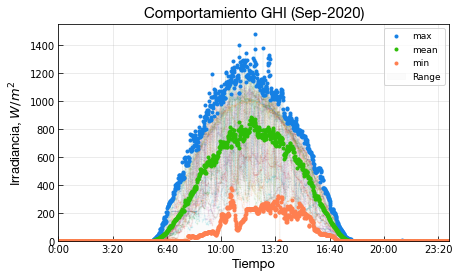

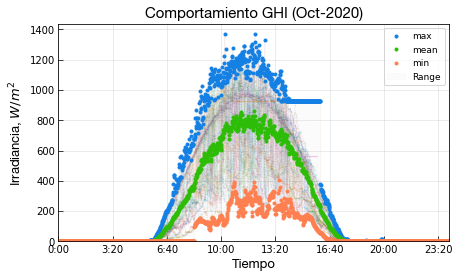

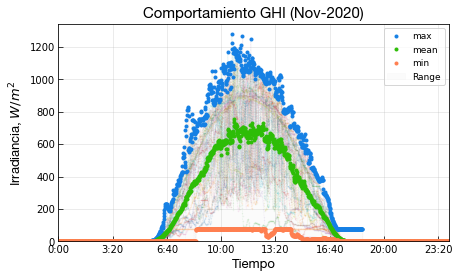

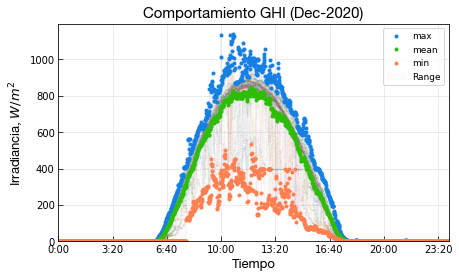

In [8]:
'''
irrad_analysis function example: analysing Jan-2021 data.
'''
#Selecting year and month to extract
years = [2020]
months = ['Jun', 'Jul', 'Sep', 'Oct', 'Nov', 'Dec']

dates = ['Jun2020', 'Jul2020', 'Sep2020', 'Oct2020', 'Nov2020', 'Dec2020']

shadows = True
if shadows == True:
    for date in dates:
        year = int(date[3:])
        month = date[:3]
        data_dict = irrad_range(year=year, month=month, dataframe=elpasoDB)
        irrad_analysis(year=year, month=month, dictionary=data_dict, title='GHI', plotall=True, which_irrad='ghi');
        #analysis_dict;

### 3.4. Comportamiento DHI

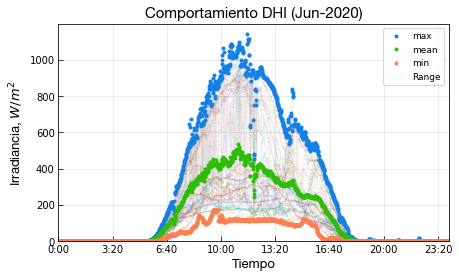

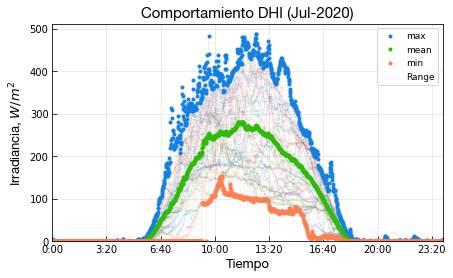

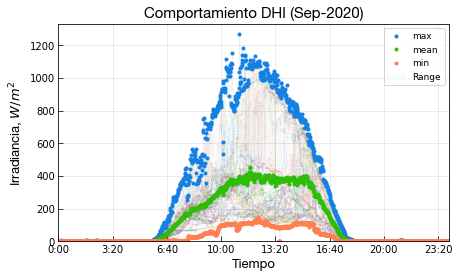

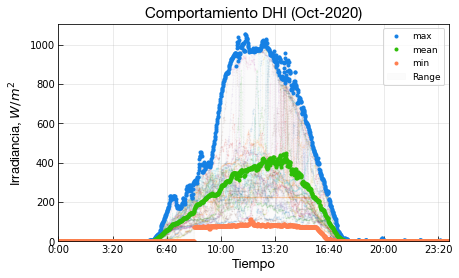

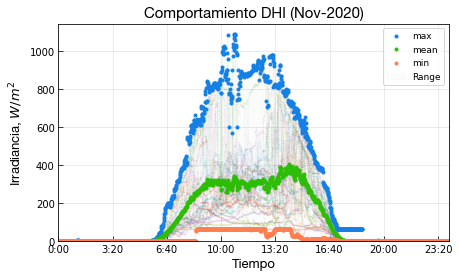

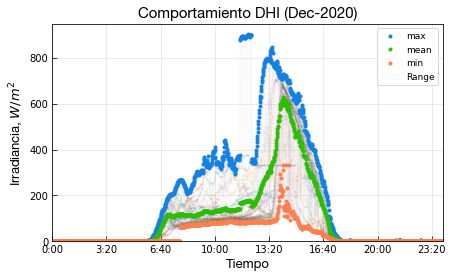

In [9]:
'''
irrad_analysis function example: analysing Jan-2021 data.
'''
#Selecting year and month to extract
years = [2020]
months = ['Jun', 'Jul','Sep', 'Oct', 'Nov', 'Dec']

dates = ['Jun2020', 'Jul2020', 'Sep2020', 'Oct2020', 'Nov2020', 'Dec2020']

shadows = True
if shadows == True:
    for date in dates:
        year = int(date[3:])
        month = date[:3]
        data_dict = irrad_range(year=year, month=month, dataframe=elpasoDB)
        irrad_analysis(year=year, month=month, dictionary=data_dict, title='DHI', plotall=True, which_irrad='dhi');
        #analysis_dict;

### 3.5. Correlación Irradiancia POA (CU #) <span style='color:White'>code:2</span>

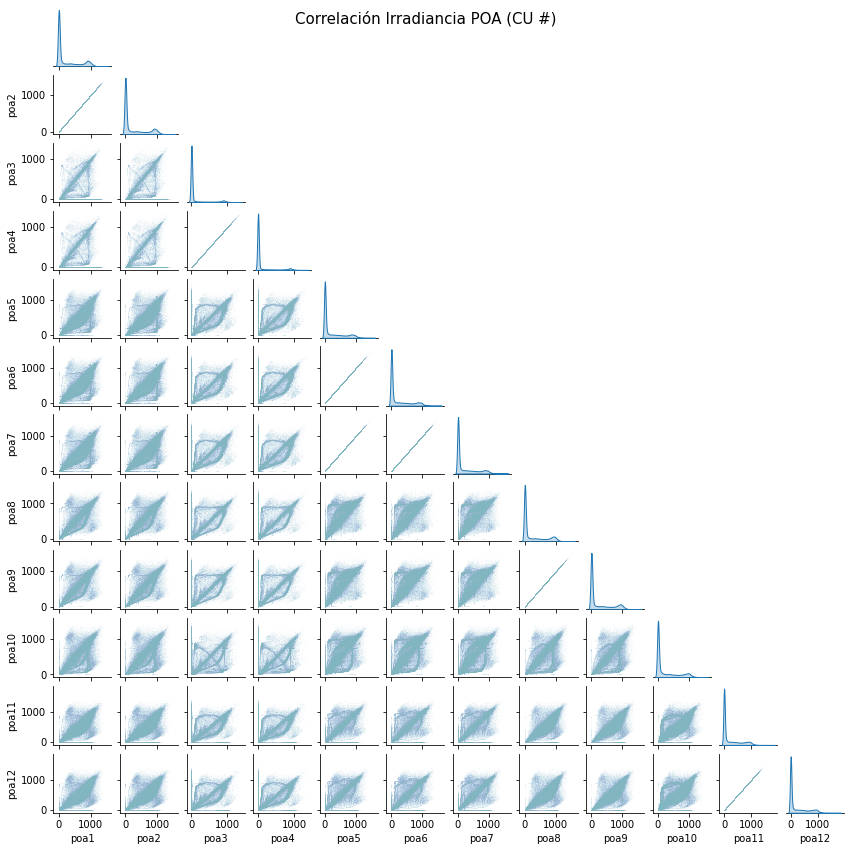

In [8]:
sns.pairplot(elpasoDB[elpasoDB.columns[9:21]], 
             corner=True, 
             diag_kind='kde', 
             plot_kws=dict(marker='.', s=0.1),
             height=1);

plt.suptitle('Correlación Irradiancia POA (CU #)', size=15);

## 4. Datos Meteorológicos

### 4.1. Posición Solar

El algoritmo de posición solar predeterminado se basa en **Reda and Andreas (2004)**.

Además de ```nrel_numpy``` (algoritmo por defecto), también están disponibles los siguientes métodos: ``` nrel_numba```, ```pyephem```, ``` ephemeris``` y ```nrel_c```.

**Info:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.solarposition.get_solarposition.html.

In [9]:
#Calculate solar position parameters
solpos = location.get_solarposition(times=elpasoDB.index,
                                    method='nrel_numpy')

solpos.head()

,apparent_zenith,zenith,apparent_elevation,elevation,azimuth,equation_of_time
Datetime,,,,,,
2020-06-01 00:00:00-05:00,148.048908,148.048908,-58.048908,-58.048908,3.162712,2.117297
2020-06-01 00:01:00-05:00,148.034288,148.034288,-58.034288,-58.034288,3.599350,2.117190
2020-06-01 00:02:00-05:00,148.017796,148.017796,-58.017796,-58.017796,4.035561,2.117082
2020-06-01 00:03:00-05:00,147.999435,147.999435,-57.999435,-57.999435,4.471292,2.116975
2020-06-01 00:04:00-05:00,147.979207,147.979207,-57.979207,-57.979207,4.906494,2.116868


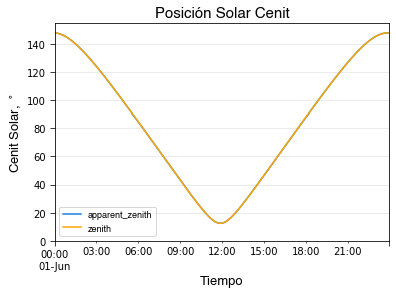

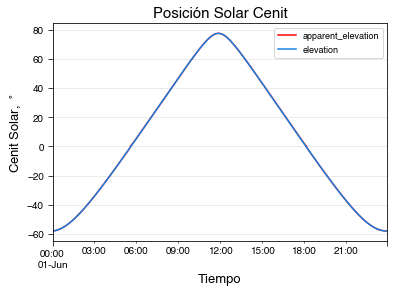

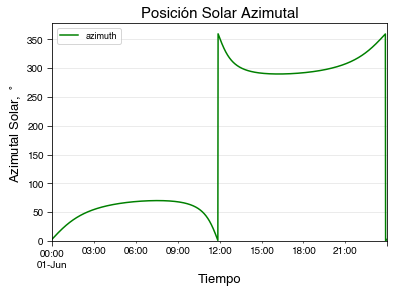

In [10]:
# Figure 1
plt.figure()

a = 0
ndays = 1
b = a + ndays*1440

solpos['apparent_zenith'][a:b].plot(label='apparent_zenith', color='#1580E4');
solpos['zenith'][a:b].plot(label='zenith', color='orange');

plot_specs(title='Posición Solar Cenit',
           ylabel='Cenit Solar, $^\circ$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

# Figure 2
plt.figure()

solpos['apparent_elevation'][a:b].plot(label='apparent_elevation', color='red');
solpos['elevation'][a:b].plot(label='elevation', color='#1580E4');

plot_specs(title='Posición Solar Cenit',
           ylabel='Cenit Solar, $^\circ$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=None, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

# Figure 3
plt.figure()

solpos['azimuth'][a:b].plot(label='azimuth', color='green');

plot_specs(title='Posición Solar Azimutal',
           ylabel='Azimutal Solar, $^\circ$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

### 4.2. Airmass

La clase Atmosphere envuelve una variedad de modelos para obtener los datos de la masa de aire. Algunos de los modelos son: (i.) **Simple**, (ii.) **Kasten 1966**, (iii.) **Young-Irvine 1967**, (iv.) **Kasten-Young 1989**, (v.) **Gueymard 1993**, **Young 1994** y **Pickering 2002**.

El modelo predeterminado es **Kasten-Young 1989**.

**Info 1 (Tutorial de Clase Atmosphere):** https://nbviewer.jupyter.org/github/pvlib/pvlib-python/blob/master/docs/tutorials/atmosphere.ipynb.

**Info 2:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.location.Location.get_airmass.html.

In [11]:
airmass = location.get_airmass(times=elpasoDB.index, 
                               solar_position=solpos, 
                               model='kastenyoung1989')

airmass.head()

,airmass_relative,airmass_absolute
Datetime,,
2020-06-01 00:00:00-05:00,NaN,NaN
2020-06-01 00:01:00-05:00,NaN,NaN
2020-06-01 00:02:00-05:00,NaN,NaN
2020-06-01 00:03:00-05:00,NaN,NaN
2020-06-01 00:04:00-05:00,NaN,NaN


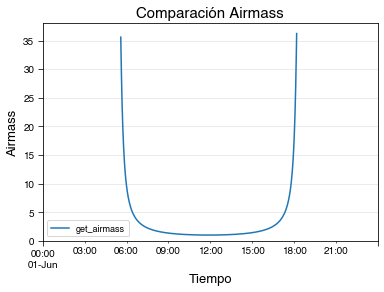

In [12]:
airmass['airmass_absolute'][a:b].plot(label='get_airmass')

plot_specs(title='Comparación Airmass',
           ylabel='Airmass',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

### 4.3. DNI Extraterrestre

Muchos algoritmos de energía solar comienzan con la irradiancia incidente en la parte superior de la atmósfera de la Tierra, a menudo conocida como radiación extraterrestre. ```PVLIB-Python``` tiene cuatro algoritmos diferentes para calcular el ciclo anual de la radiación extraterrestre dada la constante solar.

Por defecto, el método es **Spencer**. Sin embargo, se utiliza **NREL** por ser más preciso y computacionalmente eficiente [1].

El usuario también puede controlar la constante solar. La literatura reciente sugiere que la constante solar es $1361 \: W / m ^ 2$ en lugar de los $1367 \: W / m ^ 2$ comúnmente aceptados.

**Los métodos PyEphem y NREL son los más precisos**. No obstante, la diferencia entre ellos y el método de Spencer (por defecto) es tan solo $\pm \: 2 \: W/m^2$ (máximo) durante todo el año. La diferencia entre PyEphem y NREL es despreciable.

---

[1] W. Holmgren (2018). irradiance.py tutorial, notebook.community, , University of Arizona. [online]. Retrieved from: https://notebook.community/rubennj/pvlib-python/docs/tutorials/irradiance.

---

In [13]:
etr_spencer = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB.index, 
                                             method='Spencer', 
                                             solar_constant=1361);

etr_asce = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB.index, 
                                          method='Asce', 
                                          solar_constant=1361);

etr_ephem = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB.index, 
                                           method='Pyephem', 
                                           solar_constant=1361); 

etr_nrel = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB.index, 
                                          method='NREL', 
                                          solar_constant=1361);

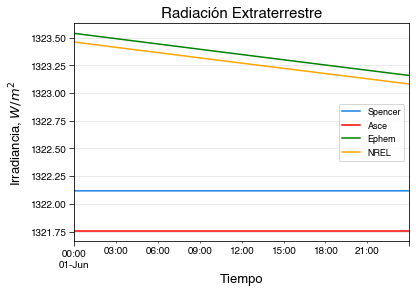

In [14]:
etr_spencer[a:b].plot(label='Spencer', color='#1580E4');
etr_asce[a:b].plot(label='Asce', color='red');
etr_ephem[a:b].plot(label='Ephem', color='green');
etr_nrel[a:b].plot(label='NREL', color='orange');

plot_specs(title='Radiación Extraterrestre',
           ylabel='Irradiancia, $W/m^2$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=None, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

## 5. Modelo de Descomposición + Transposición Propuesto

### 5.1. Descomposición: DISC <span style='color:White'>code:3</span>

El algoritmo DISC convierte la GHI en DNI a través de relaciones empíricas entre GHI e índices de claridad $K_t$. 

De acuerdo con la documentación de PVlib, el texto original que describe el modelo DISC utiliza la masa de aire relativa en lugar de la masa de aire absoluta ---i.e. corregida por presión [2]. Sin embargo, la implementación NREL del modelo DISC usa masa de aire absoluta.

La estimación del parámetro DHI se realiza mediante la siguiente ecuación:

$$
DHI = GHI - DNI \cdot cos(\theta_z)
$$

Siendo $\theta_z$ el ángulo cenit.

**Info:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.irradiance.disc.html#pvlib.irradiance.disc.

---

[2] Maxwell, E. L. (1987). A Quasi-Physical Model for Converting Hourly Global Horizontal to Direct Normal Insolation, Technical Report No. SERI/TR-215-3087, Golden, CO: Solar Energy Research Institute, 1987.

---

In [15]:
#Original DISC: Relative Airmass
disc = pvlib.irradiance.disc(ghi=elpasoDB.ghi, 
                             solar_zenith=solpos.zenith, 
                             datetime_or_doy=elpasoDB.index, 
                             pressure=None, #Absolute Airmass: 101325, Relative Airmass: None (elpasoDB.pressure*100)
                             min_cos_zenith=0.065, 
                             max_zenith=87, #80
                             max_airmass=12) #Max airmass value to allow in Kt calc; value 12 comes from original paper.

disc['dhi'] = elpasoDB.ghi - disc.dni*np.cos(np.radians(solpos.zenith))

disc.head()

,dni,kt,airmass,dhi
Datetime,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:01:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:02:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:03:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:04:00-05:00,0.0,0.0,NaN,0.0


### 5.2. Transposición: Perez-Ineichen 1990 <span style='color:White'>code:4</span>

#### 5.2.1. Seguidor de Un Eje (Single-Axis Tracker)

Determina el ángulo de rotación de un seguidor de un solo eje (*single-axis tracker*) a partir de los ángulos de azimut y cenit solar instantánteos.

La gráfica presenta un solo día de funcionamiento del seguidor. El eje-y muestra la rotación del rastreador desde la horizontal (i.e. 0 grados significa paneles 'planos'). Por la mañana, los seguidores giran en ángulos negativos para mirar al este hacia el sol de la mañana; de manera equivalente, por la tarde giran en ángulos positivos para mirar al oeste hacia el sol. A mediodía los paneles están 'planos' pues el sol se ubica en la parte más alta del cielo.

**Info 1 (Tutorial de Clase Tracking):** https://pvsc-python-tutorials.github.io/PVSC48-Python-Tutorial/Tutorial%202%20-%20POA%20Irradiance.html.

**Info 2:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.tracking.singleaxis.html.

In [16]:
tracker = pvlib.tracking.singleaxis(apparent_zenith=solpos.apparent_zenith, 
                                    apparent_azimuth=solpos.azimuth, 
                                    axis_tilt=0,
                                    axis_azimuth=180, #Heading south
                                    max_angle=60, 
                                    backtrack=True, 
                                    gcr=0.2857142857142857)

tracker = tracker.fillna(0)
tracker.head()

,tracker_theta,aoi,surface_azimuth,surface_tilt
Datetime,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,0.0,0.0
2020-06-01 00:01:00-05:00,0.0,0.0,0.0,0.0
2020-06-01 00:02:00-05:00,0.0,0.0,0.0,0.0
2020-06-01 00:03:00-05:00,0.0,0.0,0.0,0.0
2020-06-01 00:04:00-05:00,0.0,0.0,0.0,0.0


Max. angle:  60.0
Min. angle:  -60.0


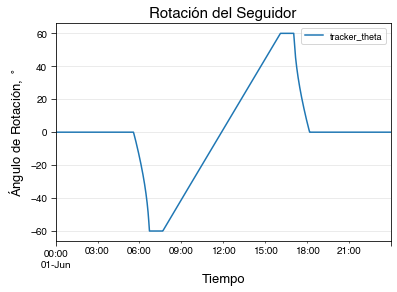

In [17]:
tracker.tracker_theta[a:b].plot()

plot_specs(title='Rotación del Seguidor',
           ylabel='Ángulo de Rotación, $^\circ$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=None, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

print('Max. angle: ', max(tracker.tracker_theta))
print('Min. angle: ', min(tracker.tracker_theta))

#### 5.2.2. Irradiancia POA <span style='color:White'>code:5</span>

Determina la irradiancia total en el plano y sus componentes (directo, cielo difuso y suelo difuso) haz, utilizando el modelo de irradiancia difusa del cielo Perez-Ineichen 1990.

$$
I_{POA} = I_{directa} + I_{cielo \: dif} + I_{suelo \: dif}
$$

**Info:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.irradiance.get_total_irradiance.html.

In [18]:
surface_albedo = irradiance.SURFACE_ALBEDOS['soil']; # Check the surfaces albedo list with print(irradiance.SURFACE_ALBEDOS.items()) function

poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                            surface_azimuth=tracker.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=disc.dni, 
                                            ghi=elpasoDB.ghi, 
                                            dhi=disc.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

poa_effective = poa_perez.copy()

poa_perez.head()

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
Datetime,,,,,
2020-06-01 00:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:01:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:02:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:03:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:04:00-05:00,0.0,-0.0,0.0,0.0,0.0


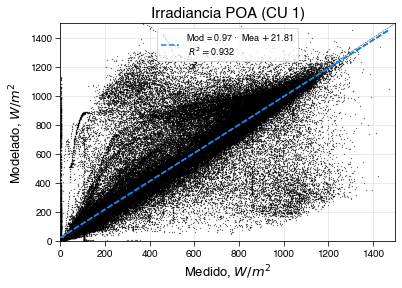

R2:  0.932
RMSE:  9.47
MAPE:  9.73


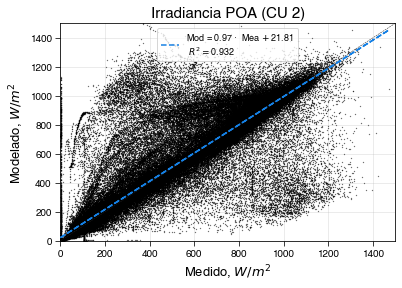

R2:  0.932
RMSE:  9.47
MAPE:  9.73


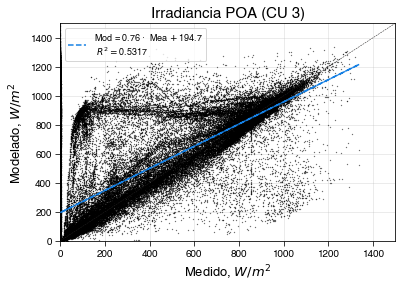

R2:  0.5317
RMSE:  27.6
MAPE:  11.08


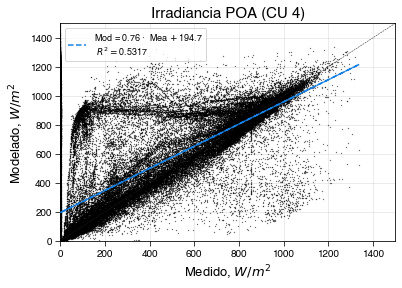

R2:  0.5317
RMSE:  27.6
MAPE:  11.08


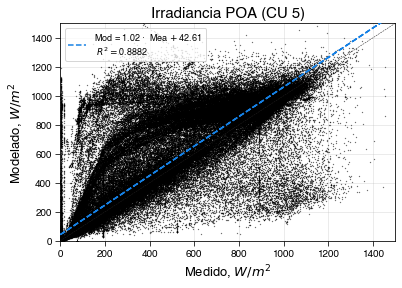

R2:  0.8882
RMSE:  11.74
MAPE:  20.79


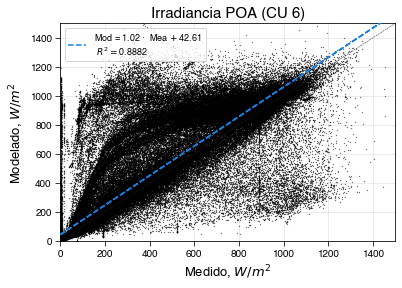

R2:  0.8882
RMSE:  11.74
MAPE:  20.79


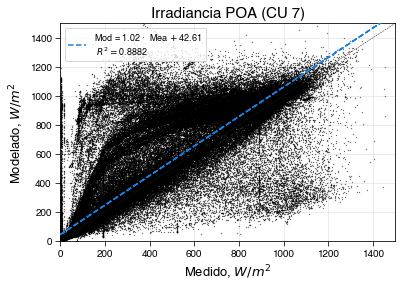

R2:  0.8882
RMSE:  11.74
MAPE:  20.79


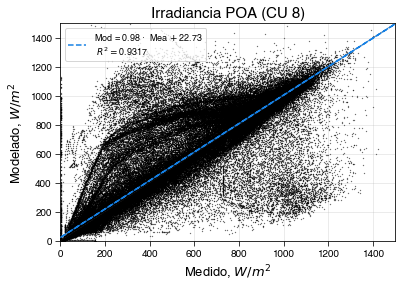

R2:  0.9317
RMSE:  9.15
MAPE:  11.48


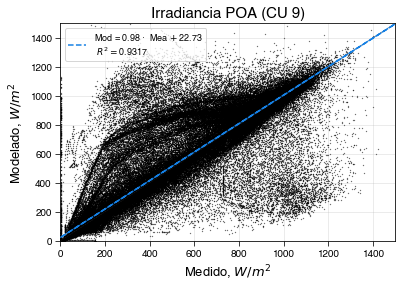

R2:  0.9317
RMSE:  9.15
MAPE:  11.48


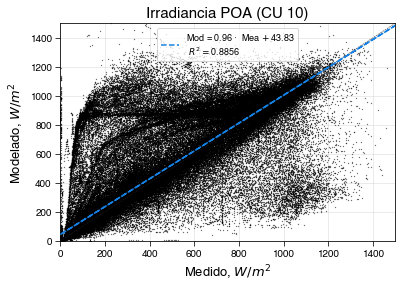

R2:  0.8856
RMSE:  11.99
MAPE:  17.48


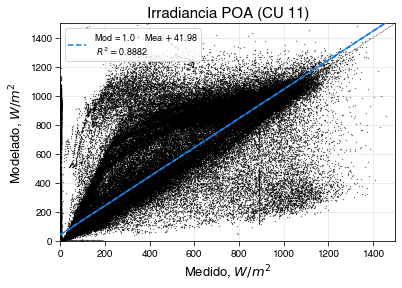

R2:  0.8882
RMSE:  10.08
MAPE:  20.52


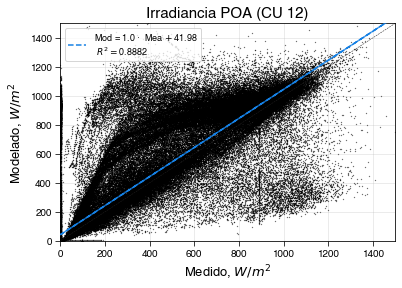

R2:  0.8882
RMSE:  10.08
MAPE:  20.52


In [19]:
for i in range(1, 13):    
    #Measured and Modeled Irradiance
    irrads = pd.DataFrame({'measured': elpasoDB[f'poa{i}'], 
                           'modeled': poa_perez.poa_global})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.measured
    y_value = irrads.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU {i})',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

In [20]:
elpasoDB['poa_std'] = elpasoDB[elpasoDB.columns[9:21]].std(axis=1)

elpasoDB[['poa_mean', 'poa_std']].describe()

,poa_mean,poa_std
count,302400.000000,302400.000000
mean,221.706118,82.934285
std,304.625844,129.621347
min,0.000000,0.000000
25%,0.000000,0.000000
50%,1.485716,0.198209
75%,455.145677,136.269237
max,1293.285314,583.831693


#### 5.2.3. Irradiancia DHI <span style='color:White'>code:6</span>

R2:  0.7043
RMSE:  10.22
MAPE:  27.13


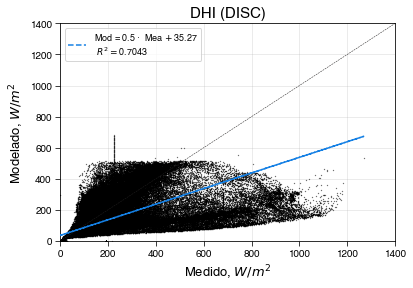

In [21]:
#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': elpasoDB.dhi, 
                       'modeled': disc.dhi})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1400

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'DHI (DISC)',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 5.2.4. Irradiancia POA (Julio 2020) <span style='color:White'>code:7</span>

R2:  0.9634
RMSE:  7.46
MAPE:  6.46


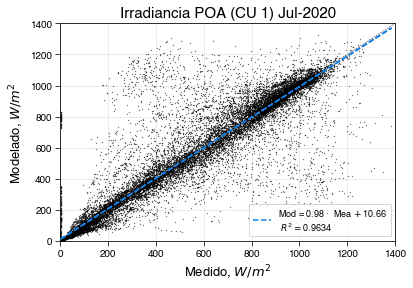

In [22]:
start = '2020-07-01T00:00:00'
end = '2020-08-01T00:00:00'

#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': elpasoDB.poa1.loc[start:end], 
                       'modeled': poa_perez.poa_global.loc[start:end]})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1400

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'Irradiancia POA (CU 1) Jul-2020',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 5.2.5. Irradiancia POA (Datos Medidos) <span style='color:White'>code:8</span>

Se calcula la irradiancia POA a partir de los componentes GHI, DHI y DNI medidos en la estación meteorológica. El ejercicio consiste en comparar la irradiancia POA estimada a partir del modelo Perez-Ineichen 1990 con aquella medida para cada subcampo.

In [23]:
dni = (elpasoDB.ghi - elpasoDB.dhi) / np.cos(np.radians(solpos.zenith))

poa = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                      surface_azimuth=tracker.surface_azimuth, 
                                      solar_zenith=solpos.zenith, 
                                      solar_azimuth=solpos.azimuth, 
                                      dni=dni, 
                                      ghi=elpasoDB.ghi, 
                                      dhi=elpasoDB.dhi, 
                                      dni_extra=etr_nrel, 
                                      airmass=airmass.airmass_relative, 
                                      albedo=surface_albedo, 
                                      surface_type='soil', 
                                      model='perez', 
                                      model_perez='allsitescomposite1990')

poa.head()

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
Datetime,,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:01:00-05:00,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:02:00-05:00,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:03:00-05:00,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:04:00-05:00,0.0,0.0,0.0,0.0,0.0


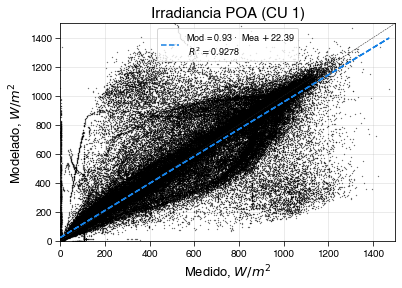

R2:  0.9278
RMSE:  9.48
MAPE:  12.94


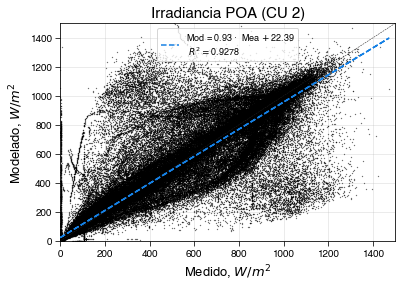

R2:  0.9278
RMSE:  9.48
MAPE:  12.94


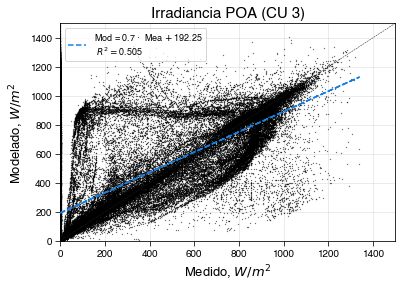

R2:  0.505
RMSE:  27.18
MAPE:  17.63


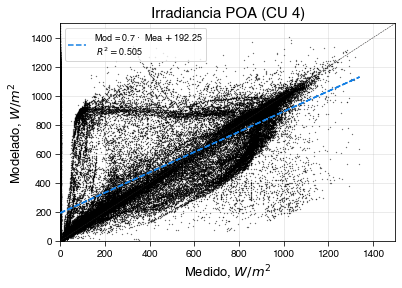

R2:  0.505
RMSE:  27.18
MAPE:  17.63


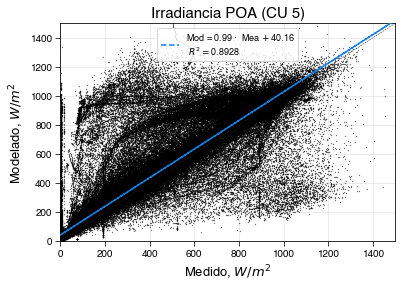

R2:  0.8928
RMSE:  10.99
MAPE:  18.81


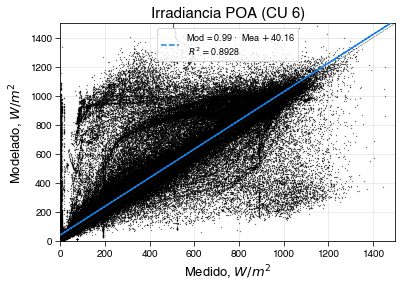

R2:  0.8928
RMSE:  10.99
MAPE:  18.81


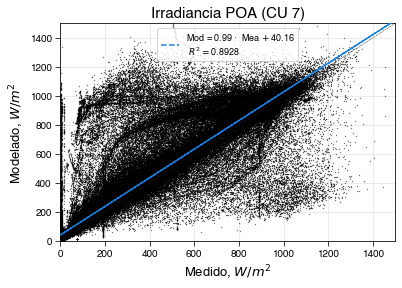

R2:  0.8928
RMSE:  10.99
MAPE:  18.81


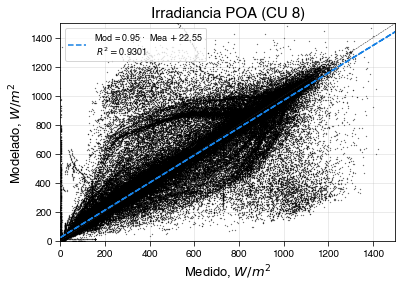

R2:  0.9301
RMSE:  8.94
MAPE:  11.87


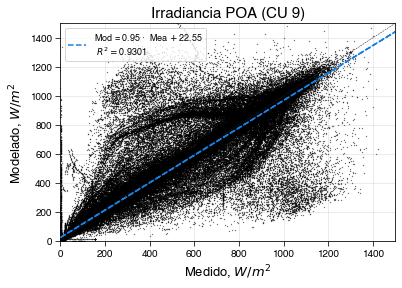

R2:  0.9301
RMSE:  8.94
MAPE:  11.87


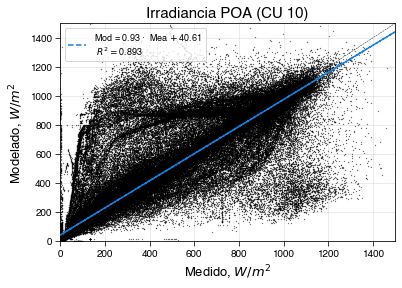

R2:  0.893
RMSE:  11.2
MAPE:  19.78


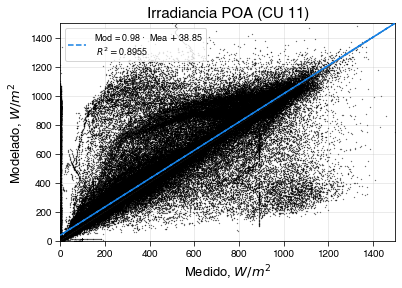

R2:  0.8955
RMSE:  9.35
MAPE:  17.46


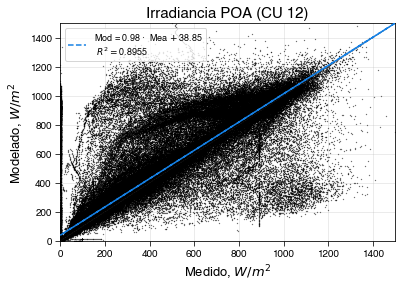

R2:  0.8955
RMSE:  9.35
MAPE:  17.46


In [24]:
for i in range(1, 13):    
    #Measured and Modeled Irradiance
    irrads = pd.DataFrame({'measured': elpasoDB[f'poa{i}'], 
                           'modeled': poa.poa_global})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.measured
    y_value = irrads.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU {i})',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 5.3. Transposición: Todos los Modelos <span style='color:White'>code:9</span>

In [25]:
#Isotropic
poa_isotropic = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=disc.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=disc.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='isotropic')

#Klucher
poa_klucher = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                              surface_azimuth=tracker.surface_azimuth, 
                                              solar_zenith=solpos.zenith, 
                                              solar_azimuth=solpos.azimuth, 
                                              dni=disc.dni, 
                                              ghi=elpasoDB.ghi, 
                                              dhi=disc.dhi, 
                                              dni_extra=etr_nrel, 
                                              airmass=airmass.airmass_relative, 
                                              albedo=surface_albedo, 
                                              surface_type='soil', 
                                              model='klucher')

#Reindl
poa_reindl = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                             surface_azimuth=tracker.surface_azimuth, 
                                             solar_zenith=solpos.zenith, 
                                             solar_azimuth=solpos.azimuth, 
                                             dni=disc.dni, 
                                             ghi=elpasoDB.ghi, 
                                             dhi=disc.dhi, 
                                             dni_extra=etr_nrel, 
                                             airmass=airmass.airmass_relative, 
                                             albedo=surface_albedo, 
                                             surface_type='soil', 
                                             model='reindl')

#King
poa_king = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                           surface_azimuth=tracker.surface_azimuth, 
                                           solar_zenith=solpos.zenith, 
                                           solar_azimuth=solpos.azimuth, 
                                           dni=disc.dni, 
                                           ghi=elpasoDB.ghi, 
                                           dhi=disc.dhi, 
                                           dni_extra=etr_nrel, 
                                           airmass=airmass.airmass_relative, 
                                           albedo=surface_albedo, 
                                           surface_type='soil', 
                                           model='king')

#Hay-Davies
poa_haydavies = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=disc.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=disc.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='haydavies')

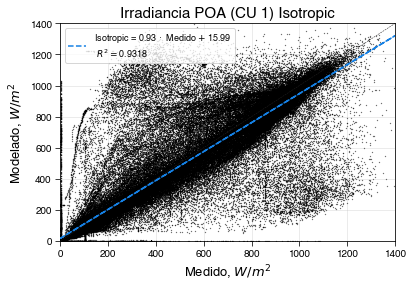

R2:  0.9318
RMSE:  9.13
MAPE:  11.8


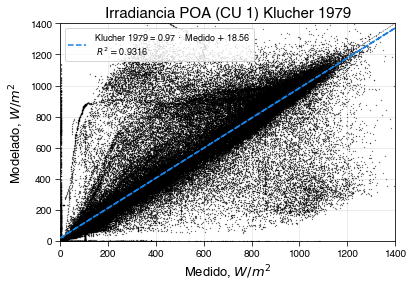

R2:  0.9316
RMSE:  9.37
MAPE:  10.14


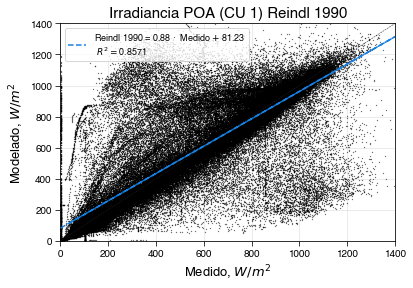

R2:  0.8571
RMSE:  13.3
MAPE:  9.97


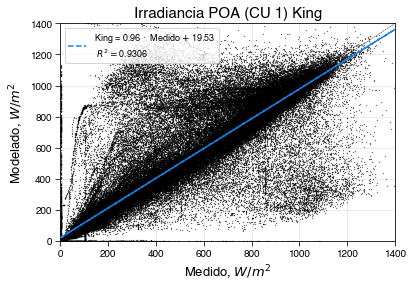

R2:  0.9306
RMSE:  9.4
MAPE:  9.74


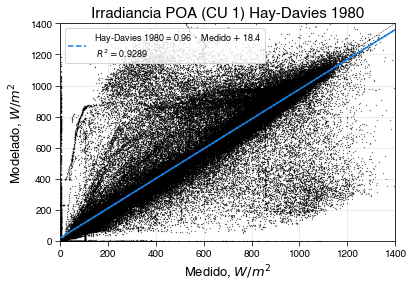

R2:  0.9289
RMSE:  9.5
MAPE:  10.57


In [26]:
list_r2 = []
list_rmse = []
list_mape = []

other_models = ['isotropic', 'klucher', 'reindl', 'king', 'haydavies']

for i in other_models:
    if i == 'isotropic':
        y_value = poa_isotropic['poa_global']
        title_name = 'Isotropic'
    
    elif i == 'klucher':
        y_value = poa_klucher['poa_global']
        title_name = 'Klucher 1979'
        
    elif i == 'reindl':
        y_value = poa_reindl['poa_global']
        title_name = 'Reindl 1990'
        
    elif i == 'king':
        y_value = poa_king['poa_global']
        title_name = 'King'
        
    else:
        y_value = poa_haydavies['poa_global']
        title_name = 'Hay-Davies 1980'
    
    #Measured and modeled POA dataframe
    irrads = pd.DataFrame({'effective_irrad': elpasoDB.poa1, 
                           'poa_global': y_value})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.effective_irrad
    y_value = irrads.poa_global

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1400

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=(f"{title_name} = " + f"{slope.round(2)} $· \:$ Medido $+ \:$" + f"{intercept.round(2)} \n $R^2 = $" 
                   + f"{r_value.round(4)}"), color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU 1) {title_name}',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

## 6. Datos Año Típico Meteorológico (TMY) El Paso

Los datos meteorológicos del año típico meteorológico para la misma locación se extraen del NREL National Solar Radiation Database (NSRDB) mediante el siguiente enlace: https://sam.nrel.gov/weather-data.html.

In [27]:
'''
Upload complete losses dataframe
'''
file_name = './elpaso_tmy.csv'
tmy = pd.read_csv(filepath_or_buffer=file_name, 
                     sep=';',
                     decimal='.',
                     header='infer')
tmy = pd.DataFrame(tmy)
tmy.fillna(0, inplace=True)

dates = []

for i in range(len(tmy)):
    date = datetime.datetime(tmy.Year[i], tmy.Month[i], tmy.Day[i], tmy.Hour[i], tmy.Minute[i])
    
    dates.append(date);

tmy['Datetime'] = pd.to_datetime(dates)
tmy = tmy.set_index('Datetime')

tmy = tmy.fillna(0)
tmy = tmy.tz_localize(tz)

tmy = tmy.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])

tmy.head()

,DHI,DNI,GHI,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Surface Albedo,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Pressure
Datetime,,,,,,,,,,,,,,,,
2020-01-01 00:00:00-05:00,0,0,0,0,0,0,7,22.5,166.77,0.2,0.0,4.2,64,80.02,26.2,997
2020-01-01 00:30:00-05:00,0,0,0,0,0,0,7,22.5,164.74,0.2,0.0,4.1,64,80.97,26.0,997
2020-01-01 01:00:00-05:00,0,0,0,0,0,0,7,22.2,160.16,0.2,0.0,4.1,65,80.66,25.8,997
2020-01-01 01:30:00-05:00,0,0,0,0,0,0,7,22.2,154.37,0.2,0.0,4.0,106,81.54,25.6,996
2020-01-01 02:00:00-05:00,0,0,0,0,0,0,7,21.6,148.03,0.2,0.0,4.0,147,79.04,25.5,996


### 6.1. Comparación Medición vs. TMY <span style='color:White'>code:10</span>

In [28]:
compar_ghi = pd.merge(elpasoDB.ghi, tmy.GHI, on=['Datetime'])
compar_dhi = pd.merge(elpasoDB.dhi, tmy.DHI, on=['Datetime'])
compar_humidity = pd.merge(elpasoDB.humidity, tmy['Relative Humidity'], on=['Datetime'])
compar_rain = pd.merge(elpasoDB.rain, tmy['Precipitable Water'], on=['Datetime'])
compar_pressure = pd.merge(elpasoDB.pressure, tmy.Pressure, on=['Datetime'])
compar_temp = pd.merge(elpasoDB.temp_air, tmy.Temperature, on=['Datetime'])

compar = {'0': compar_ghi, 
          '1': compar_dhi,
          '2': compar_humidity,
          '3': compar_rain,
          '4': compar_pressure,
          '5': compar_temp}

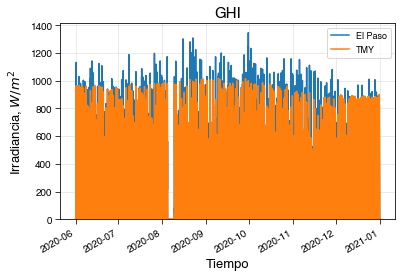

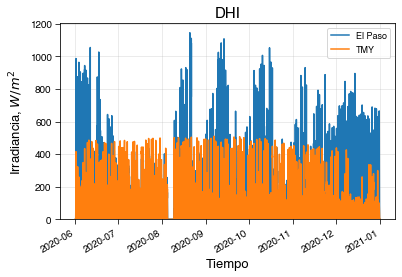

In [29]:
#GHI
plt.figure()
compar_ghi.iloc[:,0].plot(label='El Paso')
compar_ghi.iloc[:,1].plot(label='TMY')
plot_specs(title='GHI',
           ylabel='Irradiancia, $W/m^2$',
           xlabel='Tiempo',
           rot=30, 
           ylim_min=0, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

#DHI
plt.figure()
compar_dhi.iloc[:,0].plot(label='El Paso')
compar_dhi.iloc[:,1].plot(label='TMY')
plot_specs(title='DHI',
           ylabel='Irradiancia, $W/m^2$',
           xlabel='Tiempo',
           rot=30, 
           ylim_min=0, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

In [30]:
elpasoDB[['ghi', 'dhi']].describe()

,ghi,dhi
count,302400.000000,302400.000000
mean,225.704632,113.468641
std,323.752652,180.251668
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,2.110116
75%,414.533875,177.539841
max,1478.578613,1268.601318


In [31]:
tmy[['GHI', 'DHI', 'DNI']].describe()

,GHI,DHI,DNI
count,17520.000000,17520.000000,17520.000000
mean,249.361416,92.414840,219.669863
std,331.086485,126.611461,303.754927
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,5.000000,5.000000,0.000000
75%,525.000000,152.000000,435.250000
max,1043.000000,548.000000,983.000000


### 6.2. Modelo de Descomposición + Tranposición Propuesto

In [32]:
#Solar Position
solpos_tmy = location.get_solarposition(times=tmy.index, method='nrel_numpy')

#Airmass
airmass_tmy = location.get_airmass(times=tmy.index, solar_position=solpos_tmy, model='kastenyoung1989')

#Extraterrestrial DNI
etr_nrel_tmy = irradiance.get_extra_radiation(datetime_or_doy=tmy.index, method='NREL', solar_constant=1361)

#### 6.2.1. Descomposición: DISC <span style='color:White'>code:11</span>

In [33]:
#DISC
disc_tmy = pvlib.irradiance.disc(ghi=tmy.GHI, 
                                 solar_zenith=solpos_tmy.zenith, 
                                 datetime_or_doy=tmy.index, 
                                 pressure=None, #Absolute Airmass: 101325, Relative Airmass: None (elpasoDB.pressure*100)
                                 min_cos_zenith=0.065, 
                                 max_zenith=87, #80
                                 max_airmass=12) #Max airmass value to allow in Kt calc; value 12 comes from original paper.

disc_tmy['dhi'] = tmy.GHI - disc_tmy.dni*np.cos(np.radians(solpos_tmy.zenith))

R2:  0.9721
RMSE:  6.39
MAPE:  10.47


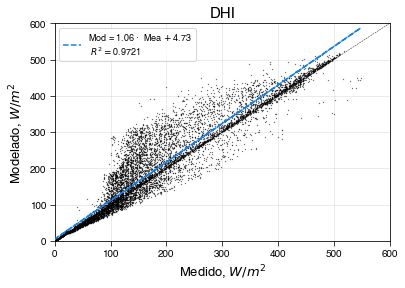

In [34]:
#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': tmy.DHI, 
                       'modeled': disc_tmy.dhi})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 600

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'DHI',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 6.2.2. Transposición: Perez-Ineichen 1990 <span style='color:White'>code:12</span>

Max. angle:  60.0
Min. angle:  -60.0


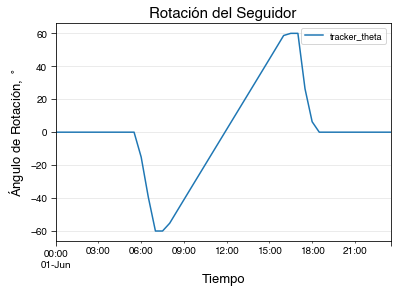

In [35]:
tracker_tmy = pvlib.tracking.singleaxis(apparent_zenith=solpos_tmy.apparent_zenith, 
                                        apparent_azimuth=solpos_tmy.azimuth, 
                                        axis_tilt=0,
                                        axis_azimuth=180, #Heading south
                                        max_angle=60, 
                                        backtrack=True, 
                                        gcr=0.2857142857142857)

tracker_tmy = tracker_tmy.fillna(0)

c = 7248
ndays = 1
d = c + ndays*48

tracker_tmy.tracker_theta[c:d].plot()

plot_specs(title='Rotación del Seguidor',
           ylabel='Ángulo de Rotación, $^\circ$',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=None, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

print('Max. angle: ', max(tracker_tmy.tracker_theta))
print('Min. angle: ', min(tracker_tmy.tracker_theta))

Mean:  0.18
Median:  0.18


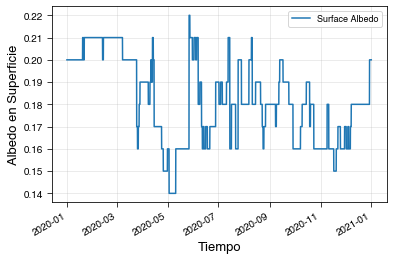

In [36]:
albedo_mean = tmy['Surface Albedo'].mean()
albedo_median = tmy['Surface Albedo'].median()

tmy['Surface Albedo'].plot()

plot_specs(title='',
           ylabel='Albedo en Superficie',
           xlabel='Tiempo',
           rot=30, 
           ylim_min=None, ylim_max=None, 
           xlim_min=None, xlim_max=None, 
           loc='best')

print('Mean: ', albedo_mean.round(2))
print('Median: ', albedo_median.round(2))

In [37]:
poa_tmy = irradiance.get_total_irradiance(surface_tilt=tracker_tmy.surface_tilt, 
                                          surface_azimuth=tracker_tmy.surface_azimuth, 
                                          solar_zenith=solpos_tmy.zenith, 
                                          solar_azimuth=solpos_tmy.azimuth, 
                                          dni=disc_tmy.dni, 
                                          ghi=tmy.GHI, 
                                          dhi=disc_tmy.dhi, 
                                          dni_extra=etr_nrel_tmy, 
                                          airmass=airmass_tmy.airmass_relative, 
                                          albedo=albedo_median, 
                                          surface_type='soil', 
                                          model='perez', 
                                          model_perez='allsitescomposite1990')

R2:  0.9294
RMSE:  10.26
MAPE:  17.59


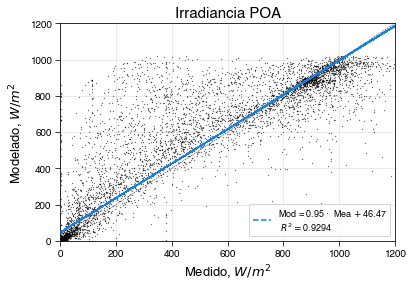

In [38]:
irrads = pd.merge(elpasoDB.poa1, poa_tmy.poa_global, on=['Datetime'])

irrads = irrads.dropna()

irrads.columns = ['measured', 'modeled']

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1200

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'Irradiancia POA',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

## 7. Otros Modelos de Descomposición + Transposición <span style='color:White'>code:13</span>

### 7.1. Erbs + Modelos Tranposición

In [39]:
erbs = pvlib.irradiance.erbs(ghi=elpasoDB.ghi, 
                             zenith=solpos.zenith, 
                             datetime_or_doy=elpasoDB.index, 
                             min_cos_zenith=0.065, 
                             max_zenith=87) #80

erbs['dhi'] = elpasoDB.ghi - erbs.dni*np.cos(np.radians(solpos.zenith))

In [40]:
#Isotropic
poa_isotropic = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=erbs.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=erbs.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='isotropic')

#Klucher
poa_klucher = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                              surface_azimuth=tracker.surface_azimuth, 
                                              solar_zenith=solpos.zenith, 
                                              solar_azimuth=solpos.azimuth, 
                                              dni=erbs.dni, 
                                              ghi=elpasoDB.ghi, 
                                              dhi=erbs.dhi, 
                                              dni_extra=etr_nrel, 
                                              airmass=airmass.airmass_relative, 
                                              albedo=surface_albedo, 
                                              surface_type='soil', 
                                              model='klucher')

#Reindl
poa_reindl = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                             surface_azimuth=tracker.surface_azimuth, 
                                             solar_zenith=solpos.zenith, 
                                             solar_azimuth=solpos.azimuth, 
                                             dni=erbs.dni, 
                                             ghi=elpasoDB.ghi, 
                                             dhi=erbs.dhi, 
                                             dni_extra=etr_nrel, 
                                             airmass=airmass.airmass_relative, 
                                             albedo=surface_albedo, 
                                             surface_type='soil', 
                                             model='reindl')

#King
poa_king = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                           surface_azimuth=tracker.surface_azimuth, 
                                           solar_zenith=solpos.zenith, 
                                           solar_azimuth=solpos.azimuth, 
                                           dni=erbs.dni, 
                                           ghi=elpasoDB.ghi, 
                                           dhi=erbs.dhi, 
                                           dni_extra=etr_nrel, 
                                           airmass=airmass.airmass_relative, 
                                           albedo=surface_albedo, 
                                           surface_type='soil', 
                                           model='king')

#Hay-Davies
poa_haydavies = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=erbs.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=erbs.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='haydavies')

#Perez-Ineichen
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                            surface_azimuth=tracker.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=erbs.dni, 
                                            ghi=elpasoDB.ghi, 
                                            dhi=erbs.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

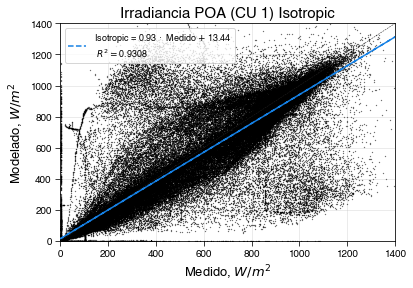

R2:  0.9308
RMSE:  9.19
MAPE:  12.22


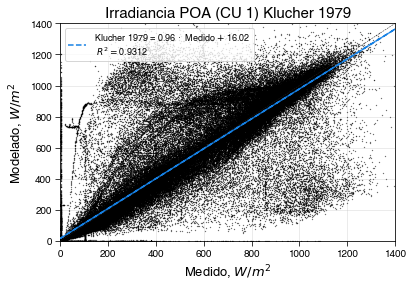

R2:  0.9312
RMSE:  9.37
MAPE:  10.29


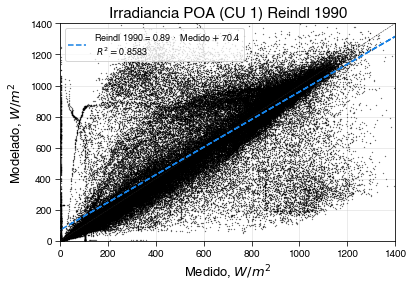

R2:  0.8583
RMSE:  13.27
MAPE:  10.11


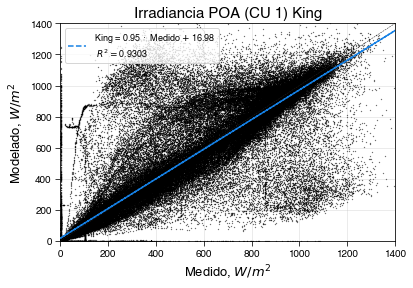

R2:  0.9303
RMSE:  9.38
MAPE:  9.69


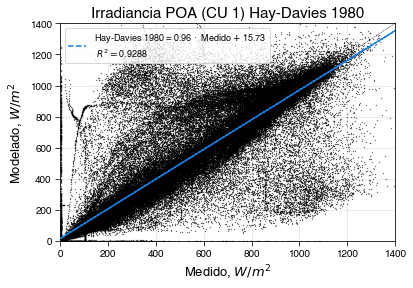

R2:  0.9288
RMSE:  9.49
MAPE:  10.79


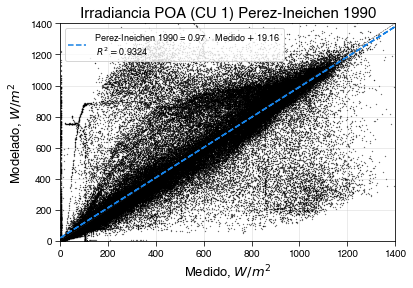

R2:  0.9324
RMSE:  9.41
MAPE:  9.68


In [41]:
list_r2 = []
list_rmse = []
list_mape = []

other_models = ['isotropic', 'klucher', 'reindl', 'king', 'haydavies', 'perez']

for i in other_models:
    if i == 'isotropic':
        y_value = poa_isotropic['poa_global']
        title_name = 'Isotropic'
    
    elif i == 'klucher':
        y_value = poa_klucher['poa_global']
        title_name = 'Klucher 1979'
        
    elif i == 'reindl':
        y_value = poa_reindl['poa_global']
        title_name = 'Reindl 1990'
        
    elif i == 'king':
        y_value = poa_king['poa_global']
        title_name = 'King'
        
    elif i == 'haydavies':
        y_value = poa_haydavies['poa_global']
        title_name = 'Hay-Davies 1980'
    
    else:
        y_value = poa_perez['poa_global']
        title_name = 'Perez-Ineichen 1990'
    
    #Measured and modeled POA dataframe
    irrads = pd.DataFrame({'effective_irrad': elpasoDB.poa1, 
                           'poa_global': y_value})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.effective_irrad
    y_value = irrads.poa_global

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1400

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=(f"{title_name} = " + f"{slope.round(2)} $· \:$ Medido $+ \:$" + f"{intercept.round(2)} \n $R^2 = $" 
                   + f"{r_value.round(4)}"), color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU 1) {title_name}',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 7.2. DIRINT + Modelos Tranposición <span style='color:White'>code:14</span>

In [42]:
pressure = elpasoDB.pressure*100.0

dirint = irradiance.dirint(ghi=elpasoDB.ghi, 
                           solar_zenith=solpos.zenith, 
                           times=elpasoDB.index, 
                           pressure=pressure, 
                           use_delta_kt_prime=True, 
                           temp_dew=None, 
                           min_cos_zenith=0.065, 
                           max_zenith=87) #80

dirint = pd.DataFrame(dirint)

dirint['dhi'] = elpasoDB.ghi - dirint.dni*np.cos(np.radians(solpos.zenith))
dirint['ghi'] = elpasoDB.ghi
dirint['effective_irrad'] = elpasoDB.poa1

dirint = dirint.dropna()

In [43]:
#Isotropic
poa_isotropic = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=dirint.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=dirint.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='isotropic')

#Klucher
poa_klucher = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                              surface_azimuth=tracker.surface_azimuth, 
                                              solar_zenith=solpos.zenith, 
                                              solar_azimuth=solpos.azimuth, 
                                              dni=dirint.dni, 
                                              ghi=elpasoDB.ghi, 
                                              dhi=dirint.dhi, 
                                              dni_extra=etr_nrel, 
                                              airmass=airmass.airmass_relative, 
                                              albedo=surface_albedo, 
                                              surface_type='soil', 
                                              model='klucher')

#Reindl
poa_reindl = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                             surface_azimuth=tracker.surface_azimuth, 
                                             solar_zenith=solpos.zenith, 
                                             solar_azimuth=solpos.azimuth, 
                                             dni=dirint.dni, 
                                             ghi=elpasoDB.ghi, 
                                             dhi=dirint.dhi, 
                                             dni_extra=etr_nrel, 
                                             airmass=airmass.airmass_relative, 
                                             albedo=surface_albedo, 
                                             surface_type='soil', 
                                             model='reindl')

#King
poa_king = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                           surface_azimuth=tracker.surface_azimuth, 
                                           solar_zenith=solpos.zenith, 
                                           solar_azimuth=solpos.azimuth, 
                                           dni=dirint.dni, 
                                           ghi=elpasoDB.ghi, 
                                           dhi=dirint.dhi, 
                                           dni_extra=etr_nrel, 
                                           airmass=airmass.airmass_relative, 
                                           albedo=surface_albedo, 
                                           surface_type='soil', 
                                           model='king')

#Hay-Davies
poa_haydavies = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=dirint.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=dirint.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='haydavies')

#Perez-Ineichen
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                            surface_azimuth=tracker.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=dirint.dni, 
                                            ghi=elpasoDB.ghi, 
                                            dhi=dirint.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

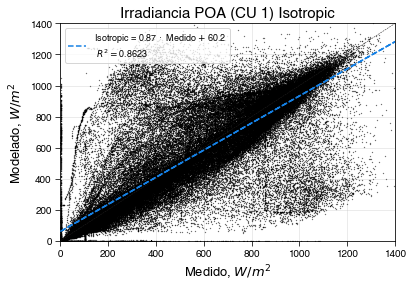

R2:  0.8623
RMSE:  12.84
MAPE:  11.74


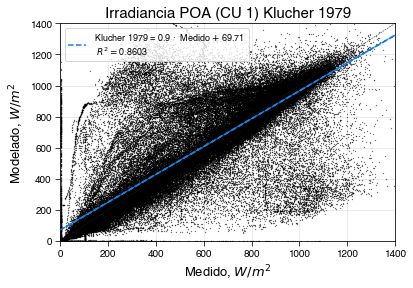

R2:  0.8603
RMSE:  13.19
MAPE:  10.08


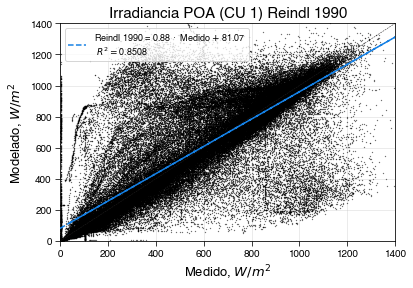

R2:  0.8508
RMSE:  13.41
MAPE:  10.16


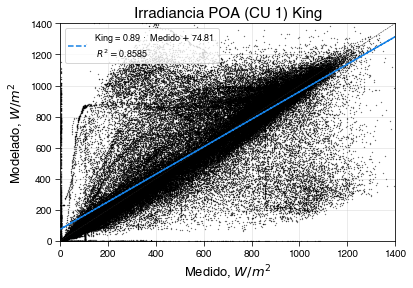

R2:  0.8585
RMSE:  13.19
MAPE:  9.41


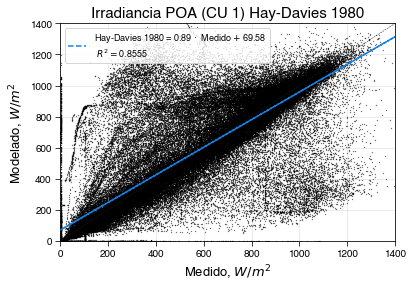

R2:  0.8555
RMSE:  13.37
MAPE:  10.59


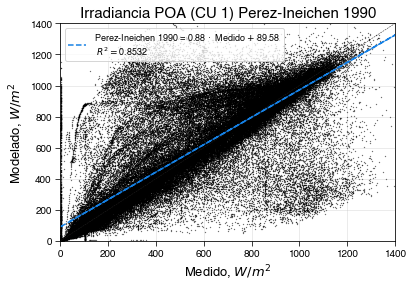

R2:  0.8532
RMSE:  13.39
MAPE:  9.28


In [44]:
list_r2 = []
list_rmse = []
list_mape = []

other_models = ['isotropic', 'klucher', 'reindl', 'king', 'haydavies', 'perez']

for i in other_models:
    if i == 'isotropic':
        y_value = poa_isotropic['poa_global']
        title_name = 'Isotropic'
    
    elif i == 'klucher':
        y_value = poa_klucher['poa_global']
        title_name = 'Klucher 1979'
        
    elif i == 'reindl':
        y_value = poa_reindl['poa_global']
        title_name = 'Reindl 1990'
        
    elif i == 'king':
        y_value = poa_king['poa_global']
        title_name = 'King'
        
    elif i == 'haydavies':
        y_value = poa_haydavies['poa_global']
        title_name = 'Hay-Davies 1980'
    
    else:
        y_value = poa_perez['poa_global']
        title_name = 'Perez-Ineichen 1990'
    
    #Measured and modeled POA dataframe
    irrads = pd.DataFrame({'effective_irrad': elpasoDB.poa1, 
                           'poa_global': y_value})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.effective_irrad
    y_value = irrads.poa_global

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1400

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=(f"{title_name} = " + f"{slope.round(2)} $· \:$ Medido $+ \:$" + f"{intercept.round(2)} \n $R^2 = $" 
                   + f"{r_value.round(4)}"), color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU 1) {title_name}',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 7.3. DIRINDEX + Modelos Tranposición <span style='color:White'>code:15</span>

In [45]:
clearsky = pvlib.clearsky.ineichen(apparent_zenith=solpos.apparent_zenith, 
                                   airmass_absolute=airmass.airmass_absolute, 
                                   altitude=altitude,
                                   linke_turbidity=1,
                                   dni_extra=etr_nrel, 
                                   perez_enhancement=True)

copy_cs = pd.DataFrame({'effective_irrad': elpasoDB.poa1})
copy_cs['ghi'] = clearsky.ghi.values
copy_cs['dni'] = clearsky.dni.values
copy_cs['dhi'] = clearsky.dhi.values

In [46]:
dirindex = irradiance.dirindex(ghi=elpasoDB.ghi, 
                               ghi_clearsky=copy_cs.ghi, 
                               dni_clearsky=copy_cs.dni,
                               zenith=solpos.zenith, 
                               times=elpasoDB.index, 
                               pressure=pressure, 
                               use_delta_kt_prime=True, 
                               temp_dew=None, 
                               min_cos_zenith=0.065, 
                               max_zenith=87) #80

dirindex = pd.DataFrame(dirindex)

dirindex['dhi'] = elpasoDB.ghi - dirindex.dni*np.cos(np.radians(solpos.zenith))
dirindex['ghi'] = elpasoDB.ghi
dirindex['effective_irrad'] = elpasoDB.poa1

dirindex = dirindex.dropna()

In [47]:
#Isotropic
poa_isotropic = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=dirindex.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=dirindex.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='isotropic')

#Klucher
poa_klucher = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                              surface_azimuth=tracker.surface_azimuth, 
                                              solar_zenith=solpos.zenith, 
                                              solar_azimuth=solpos.azimuth, 
                                              dni=dirindex.dni, 
                                              ghi=elpasoDB.ghi, 
                                              dhi=dirindex.dhi, 
                                              dni_extra=etr_nrel, 
                                              airmass=airmass.airmass_relative, 
                                              albedo=surface_albedo, 
                                              surface_type='soil', 
                                              model='klucher')

#Reindl
poa_reindl = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                             surface_azimuth=tracker.surface_azimuth, 
                                             solar_zenith=solpos.zenith, 
                                             solar_azimuth=solpos.azimuth, 
                                             dni=dirindex.dni, 
                                             ghi=elpasoDB.ghi, 
                                             dhi=dirindex.dhi, 
                                             dni_extra=etr_nrel, 
                                             airmass=airmass.airmass_relative, 
                                             albedo=surface_albedo, 
                                             surface_type='soil', 
                                             model='reindl')

#King
poa_king = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                           surface_azimuth=tracker.surface_azimuth, 
                                           solar_zenith=solpos.zenith, 
                                           solar_azimuth=solpos.azimuth, 
                                           dni=dirindex.dni, 
                                           ghi=elpasoDB.ghi, 
                                           dhi=dirindex.dhi, 
                                           dni_extra=etr_nrel, 
                                           airmass=airmass.airmass_relative, 
                                           albedo=surface_albedo, 
                                           surface_type='soil', 
                                           model='king')

#Hay-Davies
poa_haydavies = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                                surface_azimuth=tracker.surface_azimuth, 
                                                solar_zenith=solpos.zenith, 
                                                solar_azimuth=solpos.azimuth, 
                                                dni=dirindex.dni, 
                                                ghi=elpasoDB.ghi, 
                                                dhi=dirindex.dhi, 
                                                dni_extra=etr_nrel, 
                                                airmass=airmass.airmass_relative, 
                                                albedo=surface_albedo, 
                                                surface_type='soil', 
                                                model='haydavies')

#Perez-Ineichen
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker.surface_tilt, 
                                            surface_azimuth=tracker.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=dirindex.dni, 
                                            ghi=elpasoDB.ghi, 
                                            dhi=dirindex.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

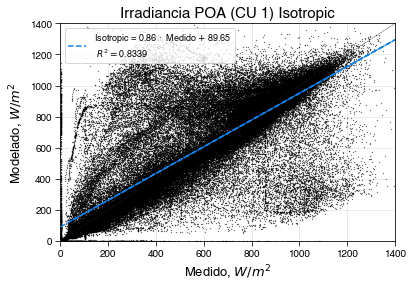

R2:  0.8339
RMSE:  13.98
MAPE:  11.16


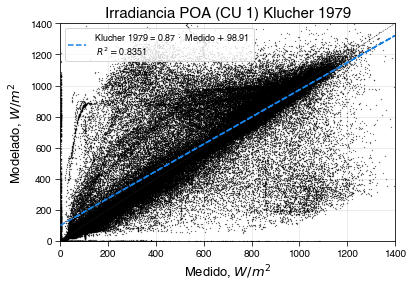

R2:  0.8351
RMSE:  14.16
MAPE:  10.01


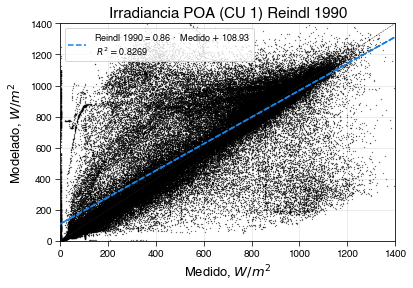

R2:  0.8269
RMSE:  14.4
MAPE:  10.08


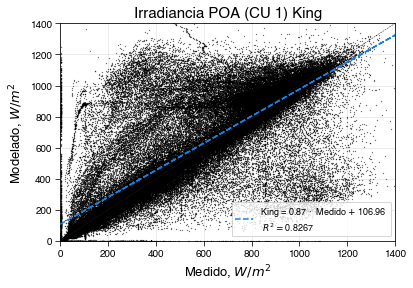

R2:  0.8267
RMSE:  14.63
MAPE:  9.96


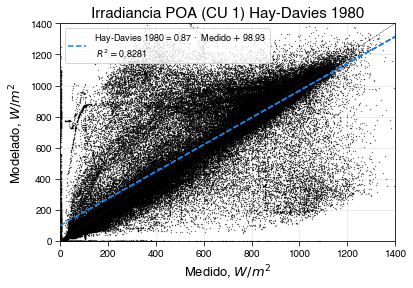

R2:  0.8281
RMSE:  14.45
MAPE:  10.49


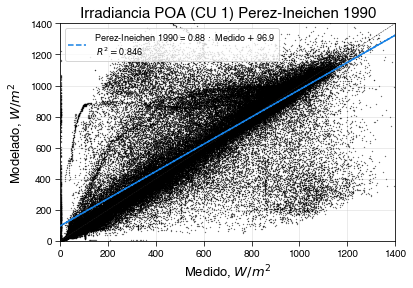

R2:  0.846
RMSE:  13.62
MAPE:  8.85


In [48]:
list_r2 = []
list_rmse = []
list_mape = []

other_models = ['isotropic', 'klucher', 'reindl', 'king', 'haydavies', 'perez']

for i in other_models:
    if i == 'isotropic':
        y_value = poa_isotropic['poa_global']
        title_name = 'Isotropic'
    
    elif i == 'klucher':
        y_value = poa_klucher['poa_global']
        title_name = 'Klucher 1979'
        
    elif i == 'reindl':
        y_value = poa_reindl['poa_global']
        title_name = 'Reindl 1990'
        
    elif i == 'king':
        y_value = poa_king['poa_global']
        title_name = 'King'
        
    elif i == 'haydavies':
        y_value = poa_haydavies['poa_global']
        title_name = 'Hay-Davies 1980'
    
    else:
        y_value = poa_perez['poa_global']
        title_name = 'Perez-Ineichen 1990'
    
    #Measured and modeled POA dataframe
    irrads = pd.DataFrame({'effective_irrad': elpasoDB.poa1, 
                           'poa_global': y_value})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.effective_irrad
    y_value = irrads.poa_global

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1400

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=(f"{title_name} = " + f"{slope.round(2)} $· \:$ Medido $+ \:$" + f"{intercept.round(2)} \n $R^2 = $" 
                   + f"{r_value.round(4)}"), color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU 1) {title_name}',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 7.4. Métricas Estadísticas Modelos Descomposición + Perez-Ineichen 1990 (CU 1)

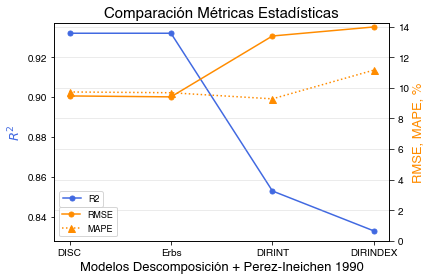

In [49]:
full_models = ['DISC', 'Erbs', 'DIRINT', 'DIRINDEX']
list_r2 = [0.932, 0.932, 0.853, 0.833]
list_rmse = [9.47, 9.41, 13.39, 13.98]
list_mape = [9.73, 9.68, 9.28, 11.16]

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(full_models, list_r2, color='royalblue', ls='-', marker='o', ms=5, label='R2')
ax2.plot(full_models, list_rmse, color='darkorange', ls='-', marker='o', ms=5, label='RMSE')
ax2.plot(full_models, list_mape, color='darkorange', ls='dotted', marker='^', ms=7, label='MAPE')

ax1.set_xlabel('Modelos Descomposición + Perez-Ineichen 1990', fontname="Helvetica", fontsize=13)
ax1.set_ylabel('$R^2$', fontname="Helvetica", fontsize=13, color='royalblue')
ax2.set_ylabel('RMSE, MAPE', fontname="Helvetica", fontsize=13, color='darkorange')

plt.rc('font', family='Helvetica')
plt.rcParams['axes.axisbelow'] = True;

plt.title('Comparación Métricas Estadísticas', fontname="Helvetica", fontsize=15);
plt.ylabel('RMSE, MAPE, %', fontname="Helvetica", fontsize=13);
#plt.xlabel('Medido, $W/m^2$', fontname="Helvetica", fontsize=13);

plt.tick_params(direction='out', length=5, width=0.75, grid_alpha=0.3)
plt.xticks(rotation=0)
plt.xlim(None, None)
plt.ylim(0, None)
plt.grid(True);
plt.legend(loc='lower left', fontsize=9);
ax1.legend(loc=(0.015, 0.155), fontsize=9);
plt.tight_layout;

## 8. DISC + Perez-Ineichen 1990: Resolución 5-min <span style='color:White'>code:16</span>

### 8.1. Resampleo 1-min a 5-min

In [50]:
elpasoDB_5min = elpasoDB.copy()

elpasoDB_5min = elpasoDB_5min.resample('5Min').mean()

elpasoDB_5min.head()

,temp_air,pressure,humidity,wind_direction,wind_speed,ghi_2,ghi,dhi,rain,poa1,...,poa5,poa6,poa7,poa8,poa9,poa10,poa11,poa12,poa_mean,poa_std
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-06-01 00:00:00-05:00,25.306781,1006.097546,94.174663,257.287360,0.509973,0.0,0.0,0.035177,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:05:00-05:00,25.305524,1006.041992,94.085779,233.681644,0.112603,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:10:00-05:00,25.413220,1006.009839,93.235925,228.486145,0.884943,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:15:00-05:00,25.468024,1006.003979,92.900661,258.943411,0.383810,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:20:00-05:00,25.395581,1006.003979,93.394202,257.993146,0.000000,0.0,0.0,0.028162,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 8.2. Datos Meteorológicos

In [51]:
#Solar Position
solpos = location.get_solarposition(times=elpasoDB_5min.index, method='nrel_numpy')

#Airmass
airmass = location.get_airmass(times=elpasoDB_5min.index, solar_position=solpos, model='kastenyoung1989')

#Extraterrestrial DNI
etr_nrel = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB_5min.index, method='NREL', solar_constant=1361)

### 8.3. Descomposición: DISC

In [52]:
#Original DISC: Relative Airmass
disc_5 = pvlib.irradiance.disc(ghi=elpasoDB_5min.ghi, 
                               solar_zenith=solpos.zenith, 
                               datetime_or_doy=elpasoDB_5min.index, 
                               pressure=None, #Absolute Airmass: 101325, Relative Airmass: None (elpasoDB.pressure*100)
                               min_cos_zenith=0.065, 
                               max_zenith=87, #80
                               max_airmass=12) #Max airmass value to allow in Kt calc; value 12 comes from original paper.

disc_5['dhi'] = elpasoDB_5min.ghi - disc_5.dni*np.cos(np.radians(solpos.zenith))

disc_5.head()

,dni,kt,airmass,dhi
Datetime,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:05:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:10:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:15:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:20:00-05:00,0.0,0.0,NaN,0.0


### 8.4. Transposición: Perez-Ineichen 1990

In [53]:
tracker_5 = pvlib.tracking.singleaxis(apparent_zenith=solpos.apparent_zenith, 
                                      apparent_azimuth=solpos.azimuth, 
                                      axis_tilt=0,
                                      axis_azimuth=180, #Heading south
                                      max_angle=60, 
                                      backtrack=True, 
                                      gcr=0.2857142857142857)

tracker_5 = tracker_5.fillna(0)

In [54]:
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker_5.surface_tilt, 
                                            surface_azimuth=tracker_5.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=disc_5.dni, 
                                            ghi=elpasoDB_5min.ghi, 
                                            dhi=disc_5.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

poa_perez.head()

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
Datetime,,,,,
2020-06-01 00:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:05:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:10:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:15:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:20:00-05:00,0.0,-0.0,0.0,0.0,0.0


### 8.5. Irradiancia POA <span style='color:White'>code:17</span>

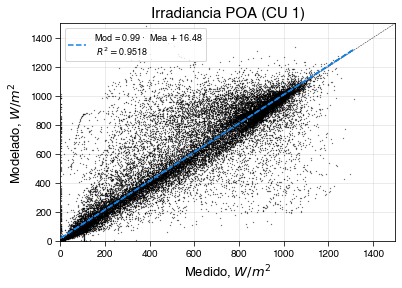

R2:  0.9518
RMSE:  8.85
MAPE:  10.17


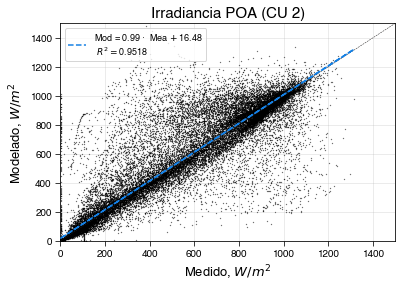

R2:  0.9518
RMSE:  8.85
MAPE:  10.17


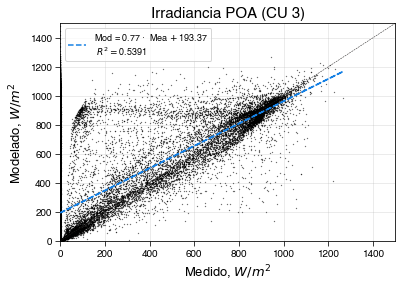

R2:  0.5391
RMSE:  28.7
MAPE:  11.64


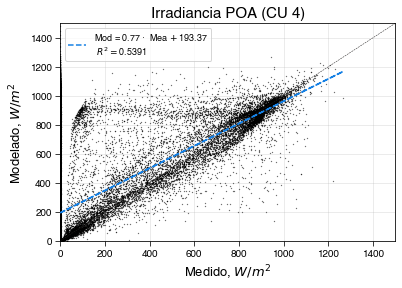

R2:  0.5391
RMSE:  28.7
MAPE:  11.64


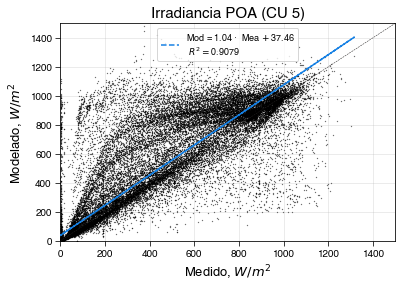

R2:  0.9079
RMSE:  12.53
MAPE:  20.06


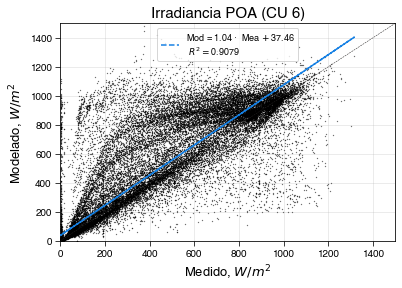

R2:  0.9079
RMSE:  12.53
MAPE:  20.06


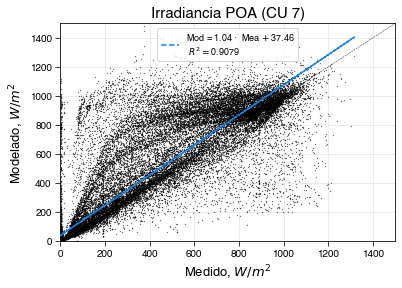

R2:  0.9079
RMSE:  12.53
MAPE:  20.06


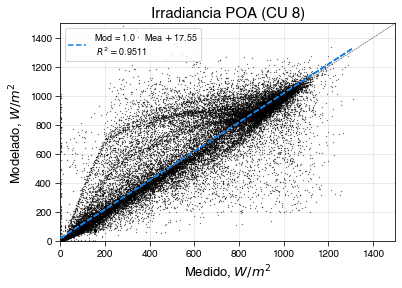

R2:  0.9511
RMSE:  8.98
MAPE:  11.79


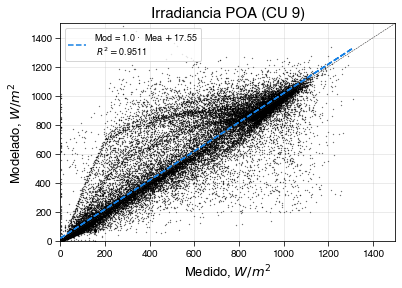

R2:  0.9511
RMSE:  8.98
MAPE:  11.79


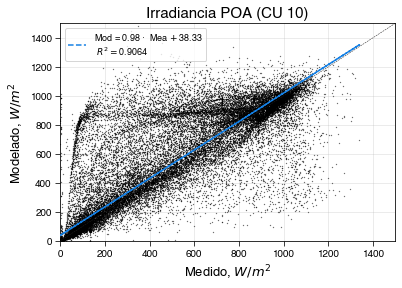

R2:  0.9064
RMSE:  12.14
MAPE:  17.2


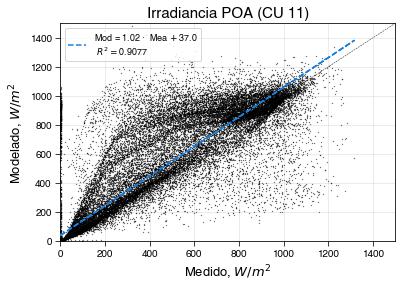

R2:  0.9077
RMSE:  12.43
MAPE:  19.81


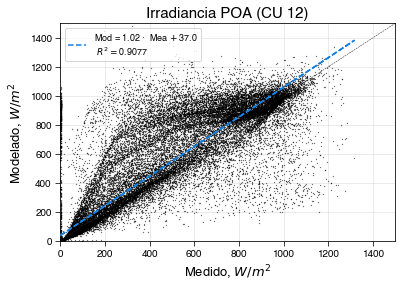

R2:  0.9077
RMSE:  12.43
MAPE:  19.81


In [55]:
for i in range(1, 13):    
    #Measured and Modeled Irradiance
    irrads = pd.DataFrame({'measured': elpasoDB_5min[f'poa{i}'], 
                           'modeled': poa_perez.poa_global})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.measured
    y_value = irrads.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU {i})',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 8.6. Irradiancia DHI <span style='color:White'>code:18</span>

R2:  0.7183
RMSE:  10.98
MAPE:  27.66


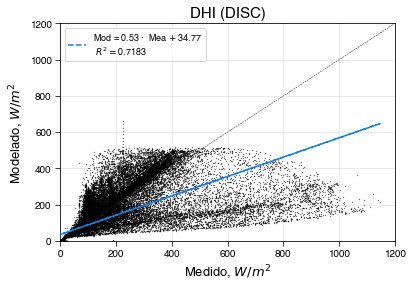

In [56]:
#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': elpasoDB_5min.dhi, 
                       'modeled': disc_5.dhi})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1200

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'DHI (DISC)',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

## 9. DISC + Perez-Ineichen 1990: Resolución 10-min <span style='color:White'>code:19</span>

### 9.1. Resampleo 1-min a 10-min

In [57]:
elpasoDB_10min = elpasoDB.copy()

elpasoDB_10min = elpasoDB_10min.resample('10Min').mean()

elpasoDB_10min.head()

,temp_air,pressure,humidity,wind_direction,wind_speed,ghi_2,ghi,dhi,rain,poa1,...,poa5,poa6,poa7,poa8,poa9,poa10,poa11,poa12,poa_mean,poa_std
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-06-01 00:00:00-05:00,25.306152,1006.069769,94.130221,245.484502,0.311288,0.0,0.0,0.017589,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:10:00-05:00,25.440622,1006.006909,93.068293,243.714778,0.634376,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:20:00-05:00,25.370697,1005.986438,93.503741,237.926252,0.000000,0.0,0.0,0.014081,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:30:00-05:00,25.301425,1005.982043,93.775079,182.696406,0.000000,0.0,0.0,0.005863,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:40:00-05:00,25.452905,1005.965967,92.664023,234.825449,0.528254,0.0,0.0,0.005863,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 9.2. Datos Meteorológicos

In [58]:
#Solar Position
solpos = location.get_solarposition(times=elpasoDB_10min.index, method='nrel_numpy')

#Airmass
airmass = location.get_airmass(times=elpasoDB_10min.index, solar_position=solpos, model='kastenyoung1989')

#Extraterrestrial DNI
etr_nrel = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB_10min.index, method='NREL', solar_constant=1361)

### 9.3. Descomposición: DISC

In [59]:
#Original DISC: Relative Airmass
disc_10 = pvlib.irradiance.disc(ghi=elpasoDB_10min.ghi, 
                                solar_zenith=solpos.zenith, 
                                datetime_or_doy=elpasoDB_10min.index, 
                                pressure=None, #Absolute Airmass: 101325, Relative Airmass: None (elpasoDB.pressure*100)
                                min_cos_zenith=0.065, 
                                max_zenith=87, #80
                                max_airmass=12) #Max airmass value to allow in Kt calc; value 12 comes from original paper.

disc_10['dhi'] = elpasoDB_10min.ghi - disc_10.dni*np.cos(np.radians(solpos.zenith))

disc_10.head()

,dni,kt,airmass,dhi
Datetime,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:10:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:20:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:30:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 00:40:00-05:00,0.0,0.0,NaN,0.0


### 9.4. Transposición: Perez-Ineichen 1990

In [60]:
tracker_10 = pvlib.tracking.singleaxis(apparent_zenith=solpos.apparent_zenith, 
                                       apparent_azimuth=solpos.azimuth, 
                                       axis_tilt=0,
                                       axis_azimuth=180, #Heading south
                                       max_angle=60, 
                                       backtrack=True, 
                                       gcr=0.2857142857142857)

tracker_10 = tracker_10.fillna(0)

In [61]:
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker_10.surface_tilt, 
                                            surface_azimuth=tracker_10.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=disc_10.dni, 
                                            ghi=elpasoDB_10min.ghi, 
                                            dhi=disc_10.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

poa_perez.head()

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
Datetime,,,,,
2020-06-01 00:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:10:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:20:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:30:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 00:40:00-05:00,0.0,-0.0,0.0,0.0,0.0


### 9.5. Irradiancia POA

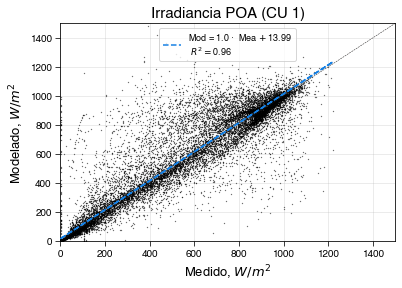

R2:  0.96
RMSE:  8.63
MAPE:  10.4


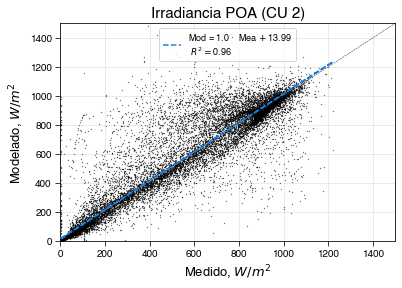

R2:  0.96
RMSE:  8.63
MAPE:  10.4


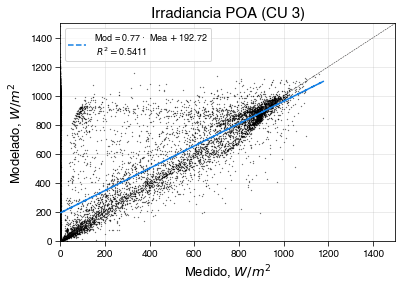

R2:  0.5411
RMSE:  30.62
MAPE:  11.97


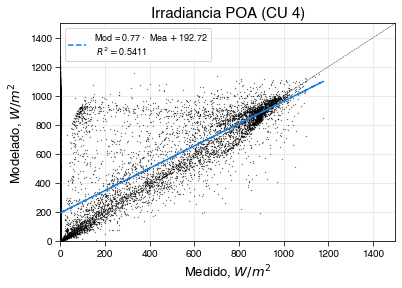

R2:  0.5411
RMSE:  30.62
MAPE:  11.97


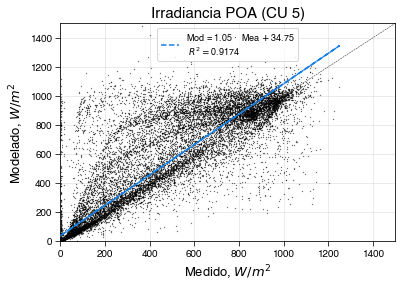

R2:  0.9174
RMSE:  12.51
MAPE:  19.06


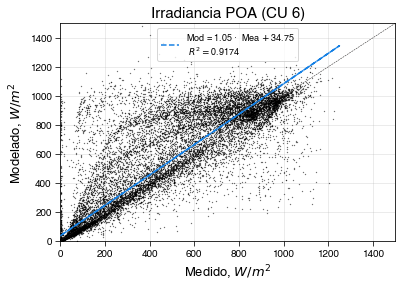

R2:  0.9174
RMSE:  12.51
MAPE:  19.06


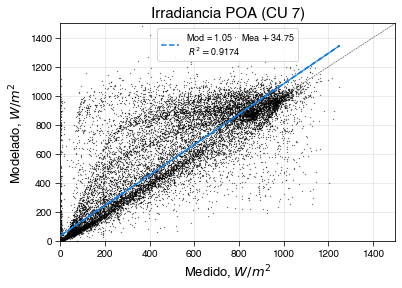

R2:  0.9174
RMSE:  12.51
MAPE:  19.06


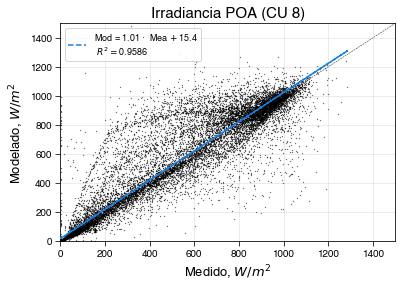

R2:  0.9586
RMSE:  8.39
MAPE:  11.46


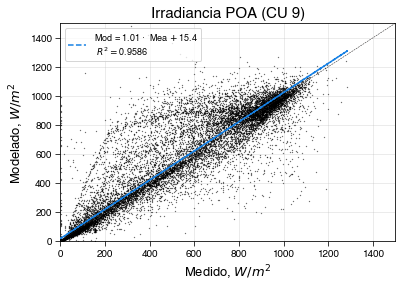

R2:  0.9586
RMSE:  8.39
MAPE:  11.46


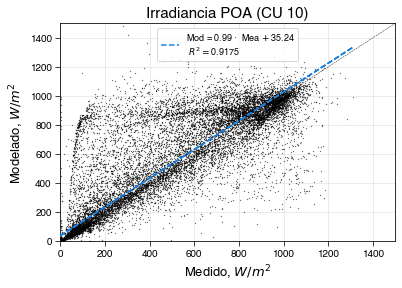

R2:  0.9175
RMSE:  11.6
MAPE:  16.9


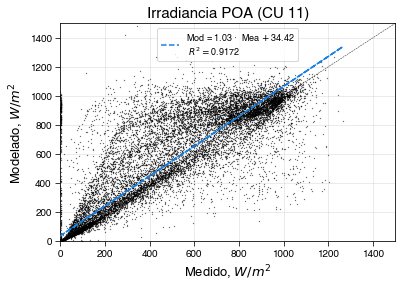

R2:  0.9172
RMSE:  12.24
MAPE:  19.0


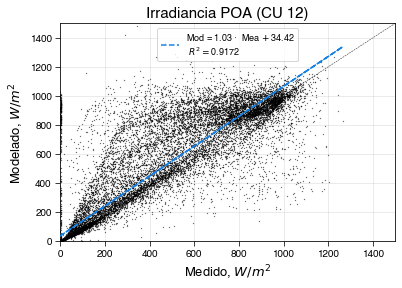

R2:  0.9172
RMSE:  12.24
MAPE:  19.0


In [62]:
for i in range(1, 13):    
    #Measured and Modeled Irradiance
    irrads = pd.DataFrame({'measured': elpasoDB_10min[f'poa{i}'], 
                           'modeled': poa_perez.poa_global})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.measured
    y_value = irrads.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU {i})',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 9.6. Irradiancia DHI <span style='color:White'>code:20</span>

R2:  0.73
RMSE:  11.05
MAPE:  28.29


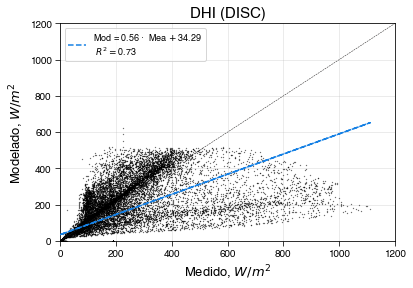

In [63]:
#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': elpasoDB_10min.dhi, 
                       'modeled': disc_10.dhi})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1200

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'DHI (DISC)',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

## 10. DISC + Perez-Ineichen 1990: Resolución 60-min <span style='color:White'>code:21</span>

### 10.1. Resampleo 1-min a 60-min

In [64]:
elpasoDB_1h = elpasoDB.copy()

elpasoDB_1h = elpasoDB_1h.resample('60Min').mean()

### 10.2. Datos Meteorológicos

In [65]:
#Solar Position
solpos = location.get_solarposition(times=elpasoDB_1h.index, method='nrel_numpy')

#Airmass
airmass = location.get_airmass(times=elpasoDB_1h.index, solar_position=solpos, model='kastenyoung1989')

#Extraterrestrial DNI
etr_nrel = irradiance.get_extra_radiation(datetime_or_doy=elpasoDB_1h.index, method='NREL', solar_constant=1361)

### 10.3. Descomposición: DISC

In [66]:
#Original DISC: Relative Airmass
disc_60 = pvlib.irradiance.disc(ghi=elpasoDB_1h.ghi, 
                                solar_zenith=solpos.zenith, 
                                datetime_or_doy=elpasoDB_1h.index, 
                                pressure=None, #Absolute Airmass: 101325, Relative Airmass: None (elpasoDB.pressure*100)
                                min_cos_zenith=0.065, 
                                max_zenith=87, #80
                                max_airmass=12) #Max airmass value to allow in Kt calc; value 12 comes from original paper.

disc_60['dhi'] = elpasoDB_1h.ghi - disc_60.dni*np.cos(np.radians(solpos.zenith))

disc_60.head()

,dni,kt,airmass,dhi
Datetime,,,,
2020-06-01 00:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 01:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 02:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 03:00:00-05:00,0.0,0.0,NaN,0.0
2020-06-01 04:00:00-05:00,0.0,0.0,NaN,0.0


### 10.4. Transposición: Perez-Ineichen 1990

In [67]:
tracker_60 = pvlib.tracking.singleaxis(apparent_zenith=solpos.apparent_zenith, 
                                    apparent_azimuth=solpos.azimuth, 
                                    axis_tilt=0,
                                    axis_azimuth=180, #Heading south
                                    max_angle=60, 
                                    backtrack=True, 
                                    gcr=0.2857142857142857)

tracker_60 = tracker_60.fillna(0)

In [68]:
poa_perez = irradiance.get_total_irradiance(surface_tilt=tracker_60.surface_tilt, 
                                            surface_azimuth=tracker_60.surface_azimuth, 
                                            solar_zenith=solpos.zenith, 
                                            solar_azimuth=solpos.azimuth, 
                                            dni=disc_60.dni, 
                                            ghi=elpasoDB_1h.ghi, 
                                            dhi=disc_60.dhi, 
                                            dni_extra=etr_nrel, 
                                            airmass=airmass.airmass_relative, 
                                            albedo=surface_albedo, 
                                            surface_type='soil', 
                                            model='perez', 
                                            model_perez='allsitescomposite1990')

poa_perez.head()

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
Datetime,,,,,
2020-06-01 00:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 01:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 02:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 03:00:00-05:00,0.0,-0.0,0.0,0.0,0.0
2020-06-01 04:00:00-05:00,0.0,-0.0,0.0,0.0,0.0


### 10.5. Irradiancia POA

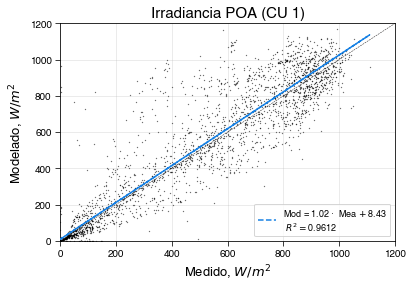

R2:  0.9612
RMSE:  9.27
MAPE:  14.35


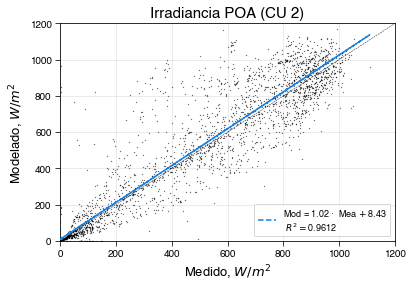

R2:  0.9612
RMSE:  9.27
MAPE:  14.35


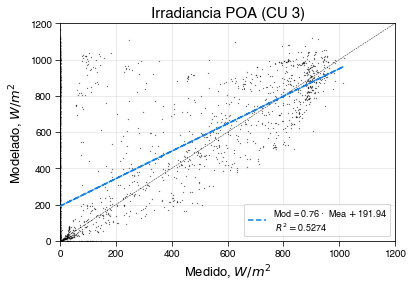

R2:  0.5274
RMSE:  35.45
MAPE:  18.93


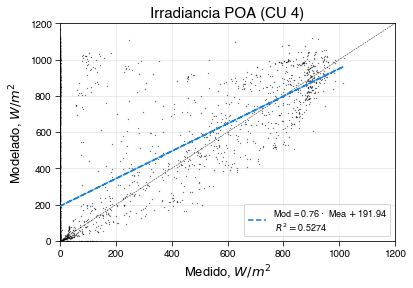

R2:  0.5274
RMSE:  35.45
MAPE:  18.93


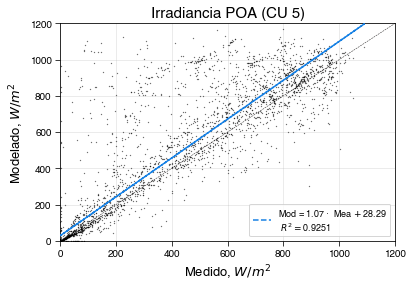

R2:  0.9251
RMSE:  13.68
MAPE:  17.57


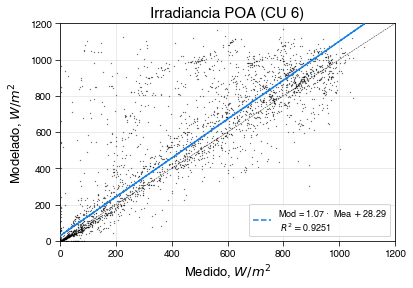

R2:  0.9251
RMSE:  13.68
MAPE:  17.57


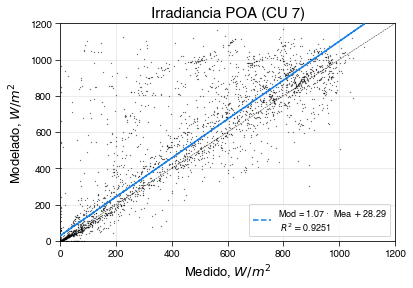

R2:  0.9251
RMSE:  13.68
MAPE:  17.57


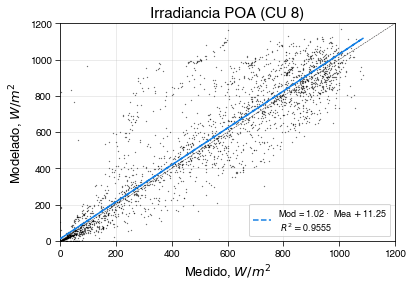

R2:  0.9555
RMSE:  10.17
MAPE:  14.46


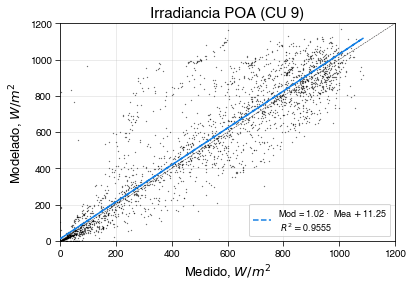

R2:  0.9555
RMSE:  10.17
MAPE:  14.46


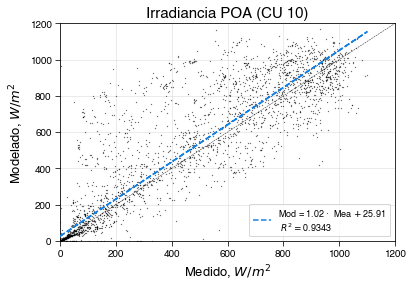

R2:  0.9343
RMSE:  12.35
MAPE:  19.94


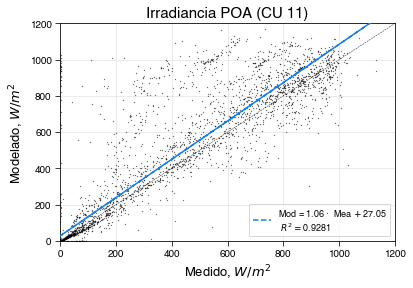

R2:  0.9281
RMSE:  12.77
MAPE:  17.15


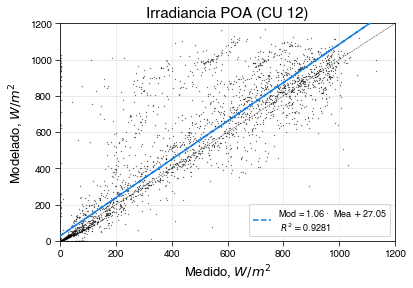

R2:  0.9281
RMSE:  12.77
MAPE:  17.15


In [69]:
for i in range(1, 13):    
    #Measured and Modeled Irradiance
    irrads = pd.DataFrame({'measured': elpasoDB_1h[f'poa{i}'], 
                           'modeled': poa_perez.poa_global})

    irrads = irrads.dropna()

    #Least Squares Linear Regression
    x_value = irrads.measured
    y_value = irrads.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 1200

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Irradiancia POA (CU {i})',
              ylabel='Modelado, $W/m^2$',
              xlabel='Medido, $W/m^2$',
              rot=0, 
              ylim_min=0, ylim_max=axis_lim, 
              xlim_min=0, xlim_max=axis_lim, 
              loc='best')
    
    plt.show()
    
    #METRICS
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

### 10.6. Irradiancia DHI <span style='color:White'>code:22</span>

R2:  0.7821
RMSE:  10.93
MAPE:  28.75


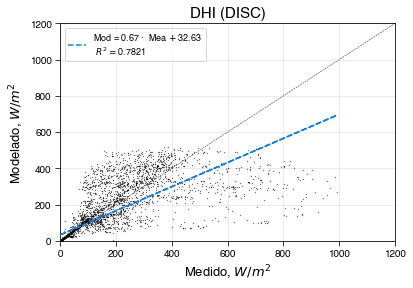

In [70]:
#Measured and Modeled Irradiance
irrads = pd.DataFrame({'measured': elpasoDB_1h.dhi, 
                       'modeled': disc_60.dhi})

irrads = irrads.dropna()

#Least Squares Linear Regression
x_value = irrads.measured
y_value = irrads.modeled

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
axis_lim = 1200

x = np.linspace(0, axis_lim, axis_lim)
y_reg = slope*x + intercept

plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

y = x
plt.plot(x, y, '--', color='#222020', linewidth=0.5)

plot_specs(title=f'DHI (DISC)',
          ylabel='Modelado, $W/m^2$',
          xlabel='Medido, $W/m^2$',
          rot=0, 
          ylim_min=0, ylim_max=axis_lim, 
          xlim_min=0, xlim_max=axis_lim, 
          loc='best')

#METRICS
metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

## 11. Configuración del Sistema <span style='color:White'>code:23</span>

### 11.1. Datos de Potencia

In [71]:
#Grab Excel Files Only
pattern = './EL_PASO/II_semestre_2020_ac/*/*.xlsx'

#Save All File Matches: xlsx_files
xlsx_files = glob.glob(pattern)
xlsx_files.sort()

#Create an empty list: frames
frames = []

#Iterate Over xlsx_files
for filename in xlsx_files:
    #METEOST
    names = ['Datetime', 'el_paso', 'la_cuna', 'linea_1', 'linea_2', 'linea_3', 'linea_4']
    columns = [1, 2, 3, 4, 5, 6, 7]
    
    df = pd.read_excel(filename, sheet_name=1, header=11, names=names, usecols=columns, skiprows=1)
    df = df.set_index('Datetime')
    df = df[:-1]

    #Append df to Frames
    frames.append(df)

#Concatenate Frames into Dataframe
#elpasoDB = pd.concat(frames).drop_duplicates()
elpaso_pac = pd.concat(frames)
#elpasoDB = elpasoDB.sort_index()
elpaso_pac = elpaso_pac.tz_localize(tz)

#Concatenate with elpasoDB
elpasoDB.drop(['poa_mean', 'poa_std'], axis=1, inplace=True)
elpasoDB = pd.concat([elpasoDB, elpaso_pac], axis=1)
elpasoDB = elpasoDB.fillna(0)

elpasoDB.head()

,temp_air,pressure,humidity,wind_direction,wind_speed,ghi_2,ghi,dhi,rain,poa1,...,poa9,poa10,poa11,poa12,el_paso,la_cuna,linea_1,linea_2,linea_3,linea_4
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-06-01 00:00:00-05:00,25.333221,1006.132629,94.191826,232.892944,0.315409,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:01:00-05:00,25.333221,1006.044922,94.203514,279.992035,0.315409,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:02:00-05:00,25.298614,1006.132629,94.199608,226.395050,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:03:00-05:00,25.298614,1006.132629,94.199608,251.137543,1.196831,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-01 00:04:00-05:00,25.270233,1006.044922,94.078758,296.019226,0.722219,0.0,0.0,0.058629,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 11.2. Inversores

El inversor no se halló en las bases de datos de PVlib (CECInverter, SandiaInverter y ADRInverter), SAM y PVFree. Se toma un inversor de características técnicas y eléctricas similares para procedentemente ajustar ciertos parámetros de acuerdo a la información de la ficha técnica. Los parámetros C0, C1, C2 y C3 son los del inversor 'equivalente'; son requeridos para la función de PVlib que modela el inversor (````pvsystem.snlinverter````).

La función ````pvlib.inverter.fit_sandia```` está sujeta a pruebas, pues parámetros de entrada requeridos por la función, tales como voltaje y potencia DC no se disponen. Las pruebas corresponderán a evaluar el modelo mediante el voltaje y potencia DC obtenidos con el circuito equivalente (función ````pvsystem.calcparams_cec````).

**Info Función snlinverter:** https://pvlib-python.readthedocs.io/en/v0.6.0/generated/pvlib.pvsystem.snlinverter.html.

**Info Función fit_sandia:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.inverter.fit_sandia.html.

In [72]:
inverters_database = 'CECInverter'
inverters = retrieve_sam(inverters_database)
inverter = inverters.Power_Electronics__FS1275CU15__690V_

inverter['Vac'] = 640
inverter['Paco'] = 1415000
inverter['Pdco'] = 1424690
inverter['Vdco'] = np.mean([950, 1400])
inverter['Vdcmax'] = 1794
inverter['Mppt_low'] = 950
inverter['Mppt_high'] = 1400
inverter['pdc0'] = inverter['Pdco']
inverter['eta_inv_nom'] = 0.9932
inverter['eta_max'] = 0.9955
inverter['eta_mppt_static'] = 0.998
inverter['eta_mppt_dynamic'] = 0.9978

inverter

Vac                                 640
Pso                             12941.1
Paco                            1415000
Pdco                            1424690
Vdco                               1175
C0                         -1.05483e-08
C1                          6.79057e-06
C2                            -0.000112
C3                             0.000557
Pnt                             416.724
Vdcmax                             1794
Idcmax                          1380.12
Mppt_low                            950
Mppt_high                          1400
CEC_Date                     10/15/2018
CEC_Type            Utility Interactive
pdc0                            1424690
eta_inv_nom                      0.9932
eta_max                          0.9955
eta_mppt_static                   0.998
eta_mppt_dynamic                 0.9978
Name: Power_Electronics__FS1275CU15__690V_, dtype: object

### 11.3. Módulos FV

In [73]:
modules_database = 'CECMOD'
modules = retrieve_sam(modules_database)

module = modules.Jinko_Solar_Co___Ltd_JKM345M_72

module['gamma_r'] = module['gamma_r']/100

module

Technology           Multi-c-Si
Bifacial                      0
STC                     345.043
PTC                       317.3
A_c                       1.835
Length                    1.924
Width                     0.954
N_s                          72
I_sc_ref                   9.31
V_oc_ref                   47.3
I_mp_ref                   8.87
V_mp_ref                   38.9
alpha_sc               0.006052
beta_oc               -0.145684
T_NOCT                     44.9
a_ref                   1.91942
I_L_ref                 9.40794
I_o_ref             1.85117e-10
R_s                    0.298768
R_sh_ref                 580.43
Adjust                  11.7788
gamma_r                -0.00409
BIPV                          N
Version       SAM 2018.11.11 r2
Date                   1/3/2019
Name: Jinko_Solar_Co___Ltd_JKM345M_72, dtype: object

### 11.4. Configuración de Arreglos FV

In [74]:
#String Boxes 7
mps_A = 30 #Modules Per String
spi_A = 168 #Strings Per Inverter

system_A = PVSystem(module_parameters=module, 
                    inverter_parameters=inverter, 
                    surface_azimuth=tracker.surface_azimuth, 
                    surface_tilt=tracker.surface_tilt, 
                    modules_per_string=mps_A, 
                    strings_per_inverter=spi_A)

#String Boxes
mps_B = 30 #Modules Per String
spi_B = 6 #Strings Per Inverter

system_B = PVSystem(module_parameters=module, 
                    inverter_parameters=inverter, 
                    surface_azimuth=tracker.surface_azimuth, 
                    surface_tilt=tracker.surface_tilt, 
                    modules_per_string=mps_B, 
                    strings_per_inverter=spi_B)

## 12. Modelado de Producción con PVlib: Datos Medidos <span style='color:White'>code:24</span>

### 12.1. Temperatura de las Celdas

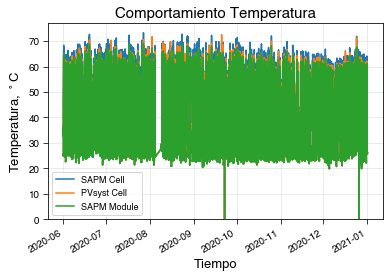

In [75]:
temp_cell = pvlib.temperature.sapm_cell(poa_global=elpasoDB.poa1, 
                                        temp_air=elpasoDB.temp_air, 
                                        wind_speed=elpasoDB.wind_speed, 
                                        a=-3.56, 
                                        b=-0.075, 
                                        deltaT=3, 
                                        irrad_ref=1000)

temp_mod = pvlib.temperature.sapm_module(poa_global=elpasoDB.poa1, 
                                         temp_air=elpasoDB.temp_air, 
                                         wind_speed=elpasoDB.wind_speed, 
                                         a=-3.56, 
                                         b=-0.075)

temp_cell_pvs = pvlib.temperature.pvsyst_cell(poa_global=elpasoDB.poa1, 
                                              temp_air=elpasoDB.temp_air, 
                                              wind_speed=elpasoDB.wind_speed, 
                                              u_c=29.0, 
                                              u_v=0.0, 
                                              eta_m=0.1, 
                                              alpha_absorption=0.9)

temp_cell.plot(label='SAPM Cell')
temp_cell_pvs.plot(label='PVsyst Cell')
temp_mod.plot(label='SAPM Module')
plot_specs(title='Comportamiento Temperatura',
          ylabel='Temperatura, $^\circ$C',
          xlabel='Tiempo',
          rot=30, 
          ylim_min=0, ylim_max=None, 
          xlim_min=None, xlim_max=None, 
          loc='best')

### 12.2. Producción DC: Voltaje, Corriente y Potencia

A partir de la función ````pvsystem.calcparams_cec```` se obtienen los parámetros del circuito equivalente que modelan a *Curva I-V* para estimar los parámetros DC en los puntos MPP.

**Info:** https://pvlib-python.readthedocs.io/en/stable/generated/pvlib.pvsystem.calcparams_cec.html.

In [76]:
def dc_production(effective_irradiance, module_temperature):
    #Single Diode Parameters
    IL, I0, Rs, Rsh, nNsVth = pvsystem.calcparams_cec(effective_irradiance,
                                                      module_temperature,
                                                      module['alpha_sc'],
                                                      module['a_ref'],
                                                      module['I_L_ref'],
                                                      module['I_o_ref'],
                                                      module['R_sh_ref'],
                                                      module['R_s'],
                                                      module['Adjust'],
                                                      EgRef=1.121,
                                                      dEgdT=-0.0002677)

    curve_info = pvsystem.singlediode(photocurrent=IL,
                                      saturation_current=I0,
                                      resistance_series=Rs,
                                      resistance_shunt=Rsh,
                                      nNsVth=nNsVth,
                                      ivcurve_pnts=100,
                                      method='lambertw')

    #Scalating CEC et. al. Single Diode Results
    data_i_sc = pd.Series(curve_info['i_sc'])
    data_v_oc = pd.Series(curve_info['v_oc'])
    data_i_mp = pd.Series(curve_info['i_mp'])
    data_v_mp = pd.Series(curve_info['v_mp'])
    data_p_mp = pd.Series(curve_info['p_mp'])
    data_i_x = pd.Series(curve_info['i_x'])
    data_i_xx = pd.Series(curve_info['i_xx'])

    results_general = pd.DataFrame({'i_sc': data_i_sc, 
                                    'v_oc': data_v_oc,
                                    'i_mp': data_i_mp, 
                                    'v_mp': data_v_mp, 
                                    'p_mp': data_p_mp, 
                                    'i_x': data_i_x,
                                    'i_xx': data_i_xx})

    #DC Dataframe
    datetime_index = effective_irradiance.index

    dc_A = system_A.scale_voltage_current_power(results_general)
    dc_A = dc_A.set_index(datetime_index)

    dc_B = system_B.scale_voltage_current_power(results_general)
    dc_B = dc_B.set_index(datetime_index)
    
    return dc_A, dc_B

### 12.3. Pérdidas

Se introduce un valor de pérdidas de **26.9%** sobre la producción DC que afectará la Potencia AC y Energía Diaria. El valor de 26.9% es el recomendado por el método de estimación de pérdidas de PVWatts y lo valida Marion et al. (2005).

---

[3] A.P. Dobos (2014). PVWatts Version 5 Manual, National Renewable Energy Lab.(NREL), US DOE Office of Energy Efficiency and Renewable Energy (EERE), doi: 10.2172/1158421.

[4] B. Marion, J. Adelstein, K. Boyle, H. Hayden, B. Hammond, T. Fletcher, B. Canada, D. Narang, A. Kimber, L. Mitchell, G. Rich and T. Townsend (2005). Performance parameters for grid-connected PV systems. Conference Record of the IEEE Photovoltaic Specialists Conference, pp. 1601–1606, doi: 10.1109/PVSC.2005.1488451.

---

In [77]:
def losses(dc_A, dc_B, loss):

    losses = loss/100 #According to the paper Performance Parameters for Grid-Connected PV Systems by NREL

    #Losses System A
    dc_A['i_mp'] = dc_A['i_mp'] - dc_A['i_mp']*losses
    dc_A['p_mp'] = dc_A['p_mp'] - dc_A['p_mp']*losses

    #Losses System B
    dc_B['i_mp'] = dc_B['i_mp'] - dc_B['i_mp']*losses
    dc_B['p_mp'] = dc_B['p_mp'] - dc_B['p_mp']*losses
    
    return dc_A, dc_B

### 12.4. Potencia AC

In [78]:
#PVlib (SAPM) AC Model
def pvlib_ac_power(dc_A, dc_B, total_inversores=4*12):
    ac_A = pvsystem.snlinverter(dc_A['v_mp'], dc_A['p_mp'], inverter)
    ac_B = pvsystem.snlinverter(dc_B['v_mp'], dc_B['p_mp'], inverter)
    
    pvlib_ac = (ac_A+ac_B) * total_inversores
    
    pvlib_ac.loc[pvlib_ac < 0] = 0
    pvlib_ac.fillna(value=0, inplace=True)
    
    return pvlib_ac

#PVWatts AC Model
def pvwatts_ac_power(dc_A, dc_B, total_inversores=4*12):
    ac_A = pvsystem.pvwatts_ac(pdc=dc_A.p_mp,
                               pdc0=inverter['pdc0'],
                               eta_inv_nom=inverter['eta_inv_nom'],
                               eta_inv_ref=0.9637) #Default

    ac_B = pvsystem.pvwatts_ac(pdc=dc_B.p_mp,
                               pdc0=inverter['pdc0'],
                               eta_inv_nom=inverter['eta_inv_nom'],
                               eta_inv_ref=0.9637) #Default
 
    #Changing NaN Values from Both Arrays to Zero (To Avoid Setbacks)
    ac_A = ac_A.fillna(0)
    ac_B = ac_B.fillna(0)
    
    #Net AC Power
    pvwatts_ac = (ac_A+ac_B) * total_inversores
    
    return pvwatts_ac

### 12.5. Energía Diaria, Semanal y Mensual

In [79]:
def calc_energy(ac_sim, ac_mea, res):    
    min_to_hour = res/60 #res is data resolution (1h, i.e. 60 min); 60 minutes equivalent to hour
    
    #Resampling Measured Daily Energy    
    ac_mea = ac_mea*min_to_hour
    
    day_mea_energy = pd.DataFrame(ac_mea.resample('1d').sum()) #Daily energy
    day_mea_energy.columns = ['energy']
    
    week_mea_energy = pd.DataFrame(day_mea_energy.resample('1w').sum()) #Weekly energy
    week_mea_energy.columns = ['energy']
    
    month_mea_energy = pd.DataFrame(day_mea_energy.resample('1m').sum()) #Monthly energy
    month_mea_energy.columns = ['energy']

    #Resampling Simulated Daily Energy
    ac_sim = ac_sim*min_to_hour
    
    day_sim_energy = pd.DataFrame(ac_sim.resample('1d').sum())
    day_sim_energy.columns = ['Daily Energy']
    day_sim_energy['Daily Energy'] = day_sim_energy/mega

    day_sim_energy = day_sim_energy.resample('1d').max() #Daily energy
    
    week_sim_energy = pd.DataFrame(day_sim_energy.resample('1w').sum()) #Weekly energy
    week_sim_energy.columns = ['Daily Energy']
    
    month_sim_energy = pd.DataFrame(day_sim_energy.resample('1m').sum()) #Monthly energy
    month_sim_energy.columns = ['Daily Energy']
    
    #Energy Dataframes
    day_energy = pd.DataFrame({'measured': day_mea_energy['energy'], 'simulated': day_sim_energy['Daily Energy']}) #Daily
    week_energy = pd.DataFrame({'measured': week_mea_energy['energy'], 'simulated': week_sim_energy['Daily Energy']}) #Weekly
    month_energy = pd.DataFrame({'measured': month_mea_energy['energy'], 'simulated': month_sim_energy['Daily Energy']}) #Monthly
    
    #Percentage Error
    energyerror = {}
    
    for i in ['day', 'week', 'month']:
        if i == 'day':
            y_true = day_mea_energy
            y_pred = day_sim_energy
        
        elif i == 'week':
            y_true = week_mea_energy
            y_pred = week_sim_energy
        
        else:
            y_true = month_mea_energy
            y_pred = month_sim_energy
    
        energyerror[i] = y_true.copy()
        
        y_true = y_true['energy'].values
        y_pred = y_pred['Daily Energy'].values

        energyerror[i]['perc_error'] = ((np.abs(y_pred - y_true)/y_pred)*100).round(2)
        energyerror[i]['perc_error'] = energyerror[i]['perc_error'].round(decimals=2) 
        
    return day_energy, week_energy, month_energy, energyerror

### 12.6. Simulación Modelo (Resolución 1-min) <span style='color:White'>code:25</span>

In [80]:
kilo = 1000
mega = 1000000

#DC Production
dc_A, dc_B = dc_production(effective_irradiance=elpasoDB.poa1, 
                           module_temperature=temp_cell)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)
pvwatts_ac = pvwatts_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy, pvl_week_energy, pvl_month_energy, pvl_ee = calc_energy(ac_sim=pvlib_ac, ac_mea=elpasoDB.el_paso, res=1)
pvw_day_energy, pvw_week_energy, pvw_month_energy, pvw_ee = calc_energy(ac_sim=pvwatts_ac, ac_mea=elpasoDB.el_paso, res=1)

#### 12.6.1. Potencia AC <span style='color:White'>code:26</span>

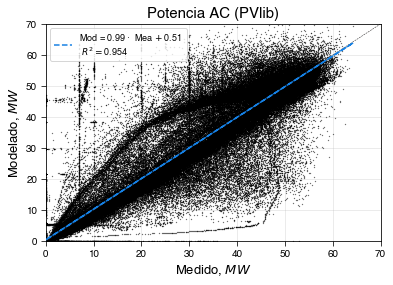

R2:  0.954
RMSE:  9.12
MAPE:  14.54


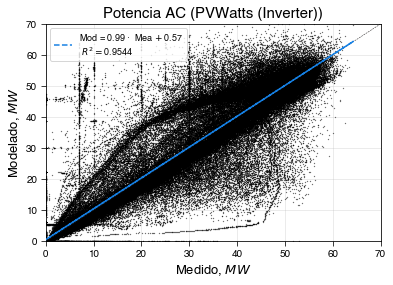

R2:  0.9544
RMSE:  9.14
MAPE:  13.28


In [81]:
for model in ['PVlib', 'PVWatts (Inverter)']:
    #Least Squares Linear Regression
    x_value = elpasoDB.el_paso
    
    if model == 'PVlib':
        y_value = pvlib_ac/mega
    else:
        y_value = pvwatts_ac/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC ({model})',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

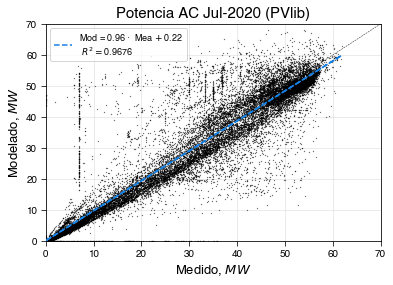

R2:  0.9676
RMSE:  8.29
MAPE:  11.49


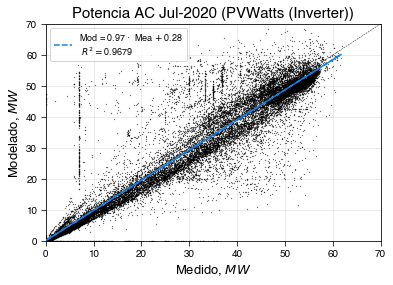

R2:  0.9679
RMSE:  8.26
MAPE:  10.65


In [82]:
for model in ['PVlib', 'PVWatts (Inverter)']:
    #Least Squares Linear Regression
    x_value = elpasoDB.el_paso[start:end]
    
    if model == 'PVlib':
        y_value = pvlib_ac[start:end]/mega
    else:
        y_value = pvwatts_ac[start:end]/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC Jul-2020 ({model})',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 12.6.2. Energía Diaria <span style='color:White'>code:27</span>

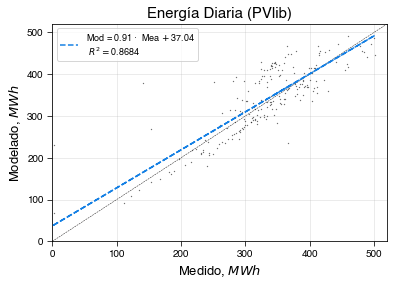

PVlib
R2:  0.8684
RMSE:  9.64
MAPE:  9.07




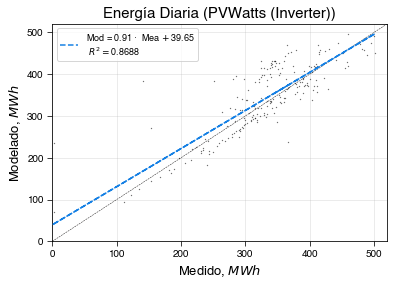

PVWatts (Inverter)
R2:  0.8688
RMSE:  9.77
MAPE:  7.84




In [83]:
for i in ['PVlib', 'PVWatts (Inverter)']:
    if i == 'PVlib':
        x_value = pvl_day_energy.measured
        y_value = pvl_day_energy.simulated
        ee = pvl_ee['day']
    
    else:
        x_value = pvw_day_energy.measured
        y_value = pvw_day_energy.simulated
        ee = pvw_ee['day']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 520

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Diaria ({i})',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(i)
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 12.6.3. Energía Semanal <span style='color:White'>code:28</span>

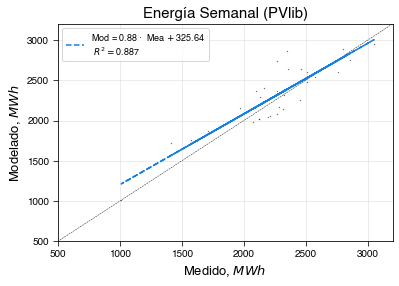

PVlib
R2:  0.887
RMSE:  6.52
MAPE:  6.81




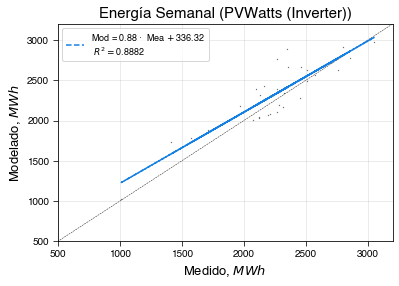

PVWatts (Inverter)
R2:  0.8882
RMSE:  6.74
MAPE:  5.99




In [84]:
for i in ['PVlib', 'PVWatts (Inverter)']:
    if i == 'PVlib':
        x_value = pvl_week_energy.measured
        y_value = pvl_week_energy.simulated
        ee = pvl_ee['week']
    
    else:
        x_value = pvw_week_energy.measured
        y_value = pvw_week_energy.simulated
        ee = pvw_ee['week']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 3200

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Semanal ({i})',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=500, ylim_max=axis_lim, 
               xlim_min=500, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(i)
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 12.6.4. Energía Mensual <span style='color:White'>code:29</span>

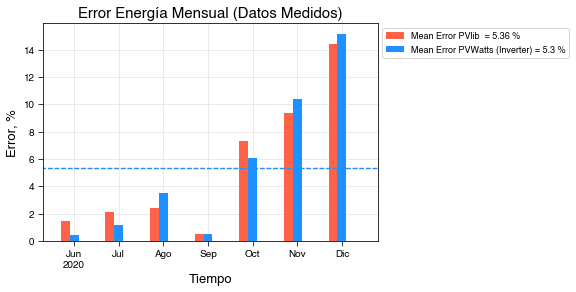

In [85]:
#Energy Error Comparison Plot
bar_width = 0.1
width = bar_width*2

months = ['Jun\n2020', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

x = np.arange(len(months))

r1 = np.arange(len(months))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

#Mean Error Values
pvlib_meanerror = round(pvl_ee['month']['perc_error'].mean(), 2)
pvwatts_meanerror = round(pvw_ee['month']['perc_error'].mean(), 2)

#Bar Plots
hor, ver = 13, 5
#plt.figure(figsize=(hor,ver))

plt.bar(r1, pvl_ee['month']['perc_error'], width, 
        label='Mean Error PVlib  = ' + f'{pvlib_meanerror}' + ' %', color='tomato', linewidth=2)

plt.bar(r3, pvw_ee['month']['perc_error'], width, 
        label='Mean Error PVWatts (Inverter) = ' + f'{pvwatts_meanerror}' + ' %', color='dodgerblue', linewidth=2)

#Horizontal Lines
plt.hlines(y=0, xmin=-1, xmax=x[-1]+1, colors='black', linestyles='solid', linewidth=0.5) #Zero
plt.hlines(y=pvlib_meanerror, xmin=-1, xmax=x[-1]+1, colors='tomato', linestyles='--', linewidth=1.25)
plt.hlines(y=pvwatts_meanerror, xmin=-1, xmax=x[-1]+1, colors='dodgerblue', linestyles='--', linewidth=1.25)

plt.xticks(r3, months)
plot_specs(title='Error Energía Mensual (Datos Medidos)',
           ylabel='Error, %',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=-0.5, xlim_max=7, 
           loc='best')
plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);

#### 12.6.5. Relación Recurso-Potencia

<span style='color:Crimson'> **Nota:** El ajuste lineal en las curvas tiene como función generar un apoyo visual a la tendencia del comportamiento de los datos. </span>

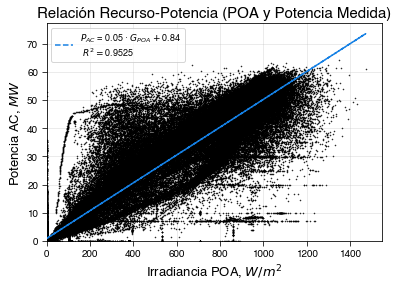

In [86]:
#Least Squares Linear Regression
y_value = elpasoDB.el_paso
x_value = elpasoDB.poa1

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('$P_{AC}$ = ' + f'{slope.round(2)} $· \:$' + '$G_{POA}$ $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=1, fillstyle='none')

plot_specs(title=f'Relación Recurso-Potencia (POA y Potencia Medida)',
           ylabel='Potencia AC, $MW$',
           xlabel='Irradiancia POA, $W/m^2$',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=0, xlim_max=None, 
           loc='best')

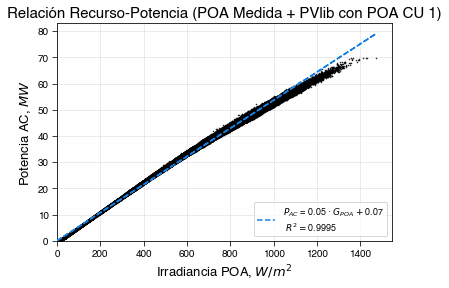

In [87]:
#Least Squares Linear Regression
y_value = pvlib_ac/mega
x_value = elpasoDB.poa1

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('$P_{AC}$ = ' + f'{slope.round(2)} $· \:$' + '$G_{POA}$ $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=1, fillstyle='none')

plot_specs(title=f'Relación Recurso-Potencia (POA Medida + PVlib con POA CU 1)',
           ylabel='Potencia AC, $MW$',
           xlabel='Irradiancia POA, $W/m^2$',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=0, xlim_max=None, 
           loc='lower right')

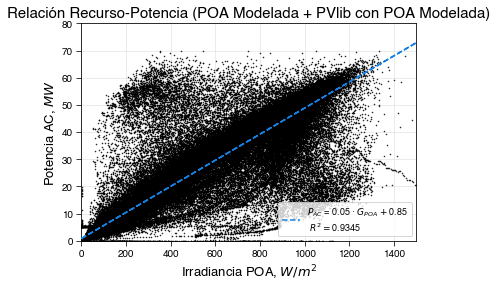

In [88]:
#Least Squares Linear Regression
y_value = pvlib_ac/mega
x_value = poa_effective.poa_global

df = pd.DataFrame({'x_val': x_value, 
                   'y_val': y_value})

df = df.dropna()

x_value = df.x_val
y_value = df.y_val

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('$P_{AC}$ = ' + f'{slope.round(2)} $· \:$' + '$G_{POA}$ $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=1, fillstyle='none')

plot_specs(title=f'Relación Recurso-Potencia (POA Modelada + PVlib con POA Modelada)',
           ylabel='Potencia AC, $MW$',
           xlabel='Irradiancia POA, $W/m^2$',
           rot=0, 
           ylim_min=0, ylim_max=80, 
           xlim_min=0, xlim_max=1500, 
           loc='lower right')

### 12.7. Simulación Modelo (Resoluciones 5-, 10- y 60-min) <span style='color:White'>code:30</span>

In [89]:
#5-min
elpasoDB_5min = elpasoDB.copy()

elpasoDB_5min = elpasoDB_5min.resample('5Min').mean()

temp_cell_5 = pvlib.temperature.sapm_cell(poa_global=elpasoDB_5min.poa1, 
                                          temp_air=elpasoDB_5min.temp_air, 
                                          wind_speed=elpasoDB_5min.wind_speed, 
                                          a=-3.56, 
                                          b=-0.075, 
                                          deltaT=3, 
                                          irrad_ref=1000)

#10-min
elpasoDB_10min = elpasoDB.copy()

elpasoDB_10min = elpasoDB_10min.resample('10Min').mean()

temp_cell_10 = pvlib.temperature.sapm_cell(poa_global=elpasoDB_10min.poa1, 
                                           temp_air=elpasoDB_10min.temp_air, 
                                           wind_speed=elpasoDB_10min.wind_speed, 
                                           a=-3.56, 
                                           b=-0.075, 
                                           deltaT=3, 
                                           irrad_ref=1000)

#60-min (1-hor)
elpasoDB_60min = elpasoDB.copy()

elpasoDB_60min = elpasoDB_60min.resample('60Min').mean()

temp_cell_60 = pvlib.temperature.sapm_cell(poa_global=elpasoDB_60min.poa1, 
                                           temp_air=elpasoDB_60min.temp_air, 
                                           wind_speed=elpasoDB_60min.wind_speed, 
                                           a=-3.56, 
                                           b=-0.075, 
                                           deltaT=3, 
                                           irrad_ref=1000)

In [90]:
#5-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=elpasoDB_5min.poa1, 
                           module_temperature=temp_cell_5)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_5 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_5, pvl_week_energy_5, pvl_month_energy_5, pvl_ee_5 = calc_energy(ac_sim=pvlib_ac_5, ac_mea=elpasoDB_5min.el_paso, res=5)

''''''

#10-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=elpasoDB_10min.poa1, 
                           module_temperature=temp_cell_10)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_10 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_10, pvl_week_energy_10, pvl_month_energy_10, pvl_ee_10 = calc_energy(ac_sim=pvlib_ac_10, ac_mea=elpasoDB_10min.el_paso, res=10)

''''''

#60-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=elpasoDB_60min.poa1, 
                           module_temperature=temp_cell_60)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_60 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_60, pvl_week_energy_60, pvl_month_energy_60, pvl_ee_60 = calc_energy(ac_sim=pvlib_ac_60, ac_mea=elpasoDB_60min.el_paso, res=60)


#### 12.7.1. Potencia AC <span style='color:White'>code:31</span>

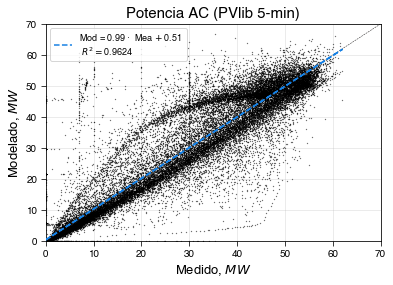

R2:  0.9624
RMSE:  8.51
MAPE:  13.41


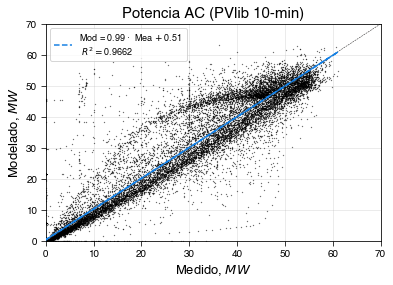

R2:  0.9662
RMSE:  8.15
MAPE:  12.77


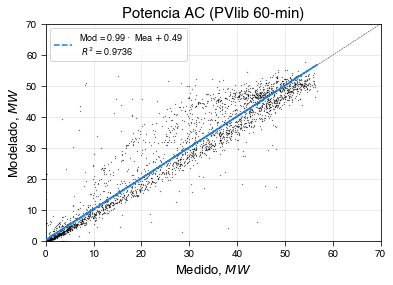

R2:  0.9736
RMSE:  7.62
MAPE:  10.96


In [91]:
for resolution in [5, 10, 60]:
    #Least Squares Linear Regression
    if resolution == 5:
        x_value = elpasoDB_5min.el_paso
        y_value = pvlib_ac_5/mega
    
    elif resolution == 10:
        x_value = elpasoDB_10min.el_paso
        y_value = pvlib_ac_10/mega
    
    else:
        x_value = elpasoDB_60min.el_paso
        y_value = pvlib_ac_60/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC (PVlib {resolution}-min)',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

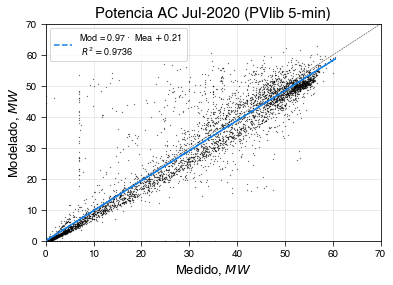

R2:  0.9736
RMSE:  7.62
MAPE:  10.66


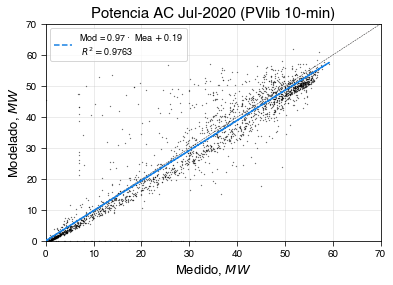

R2:  0.9763
RMSE:  7.35
MAPE:  10.39


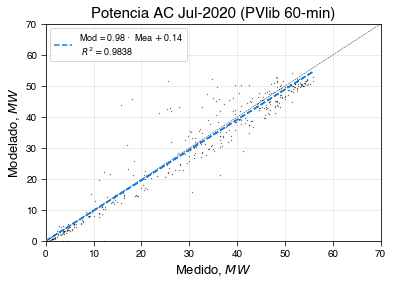

R2:  0.9838
RMSE:  6.3
MAPE:  8.68


In [92]:
for resolution in [5, 10, 60]:
    #Least Squares Linear Regression
    if resolution == 5:
        x_value = elpasoDB_5min.el_paso[start:end]
        y_value = pvlib_ac_5[start:end]/mega
    
    elif resolution == 10:
        x_value = elpasoDB_10min.el_paso[start:end]
        y_value = pvlib_ac_10[start:end]/mega
    
    else:
        x_value = elpasoDB_60min.el_paso[start:end]
        y_value = pvlib_ac_60[start:end]/mega
   
    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC Jul-2020 (PVlib {resolution}-min)',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 12.7.2. Energía Diaria

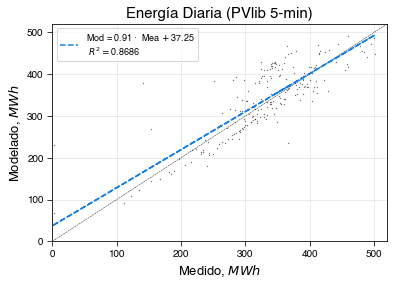

Res 5-min
R2:  0.8686
RMSE:  9.66
MAPE:  8.95




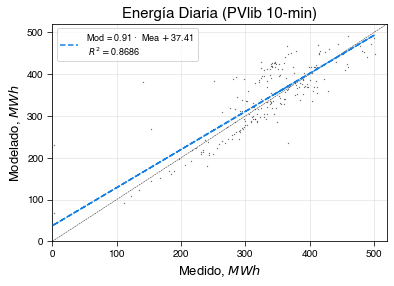

Res 10-min
R2:  0.8686
RMSE:  9.68
MAPE:  8.9




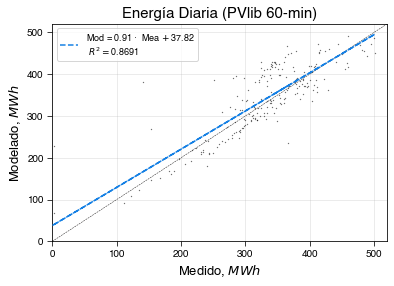

Res 60-min
R2:  0.8691
RMSE:  9.71
MAPE:  8.68




In [93]:
for i in [5, 10, 60]:
    if i == 5:
        x_value = pvl_day_energy_5.measured
        y_value = pvl_day_energy_5.simulated
        ee = pvl_ee_5['day']
    
    elif i == 10:
        x_value = pvl_day_energy_10.measured
        y_value = pvl_day_energy_10.simulated
        ee = pvl_ee_10['day']
    
    else:
        x_value = pvl_day_energy_60.measured
        y_value = pvl_day_energy_60.simulated
        ee = pvl_ee_60['day']
        
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 520

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Diaria (PVlib {i}-min)',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(f'Res {i}-min')
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 12.7.3. Energía Semanal

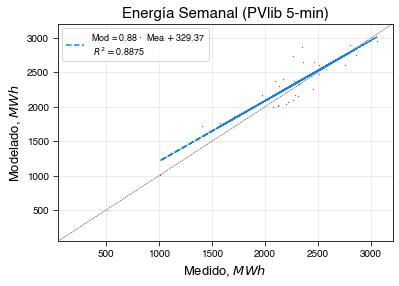

Res 5-min
R2:  0.8875
RMSE:  6.55
MAPE:  6.97




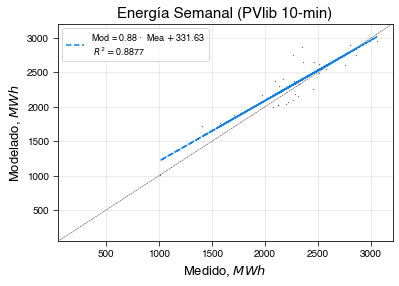

Res 10-min
R2:  0.8877
RMSE:  6.56
MAPE:  6.96




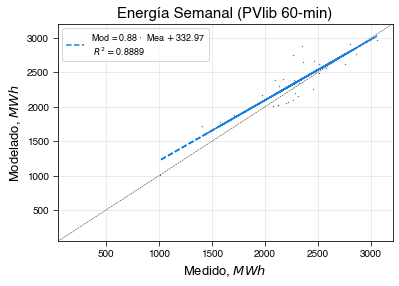

Res 60-min
R2:  0.8889
RMSE:  6.62
MAPE:  6.7




In [94]:
for i in [5, 10, 60]:
    if i == 5:
        x_value = pvl_week_energy_5.measured
        y_value = pvl_week_energy_5.simulated
        ee = pvl_ee_5['week']
    
    elif i == 10:
        x_value = pvl_week_energy_10.measured
        y_value = pvl_week_energy_10.simulated
        ee = pvl_ee_10['week']
    
    else:
        x_value = pvl_week_energy_60.measured
        y_value = pvl_week_energy_60.simulated
        ee = pvl_ee_60['week']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 3200

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Semanal (PVlib {i}-min)',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=50, ylim_max=axis_lim, 
               xlim_min=50, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(f'Res {i}-min')
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 12.7.4. Energía Mensual <span style='color:White'>code:32</span>

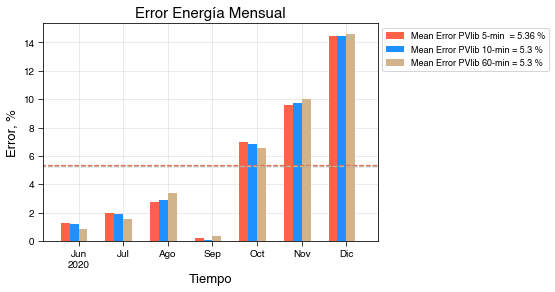

In [95]:
#Energy Error Comparison Plot
bar_width = 0.1
width = bar_width*2

months = ['Jun\n2020', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

x = np.arange(len(months))

r1 = np.arange(len(months))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
r4 = [x + bar_width for x in r3]
r5 = [x + bar_width for x in r4]

#Mean Error Values
pvlib_meanerror_5 = round(pvl_ee_5['month']['perc_error'].mean(), 2)
pvlib_meanerror_10 = round(pvl_ee_10['month']['perc_error'].mean(), 2)
pvlib_meanerror_60 = round(pvl_ee_60['month']['perc_error'].mean(), 2)

#Bar Plots
hor, ver = 13, 5
#plt.figure(figsize=(hor,ver))

plt.bar(r1, pvl_ee_5['month']['perc_error'], width, 
        label='Mean Error PVlib 5-min  = ' + f'{pvlib_meanerror}' + ' %', color='tomato', linewidth=2)

plt.bar(r3, pvl_ee_10['month']['perc_error'], width, 
        label='Mean Error PVlib 10-min = ' + f'{pvwatts_meanerror}' + ' %', color='dodgerblue', linewidth=2)

plt.bar(r5, pvl_ee_60['month']['perc_error'], width, 
        label='Mean Error PVlib 60-min = ' + f'{pvwatts_meanerror}' + ' %', color='tan', linewidth=2)

#Horizontal Lines
plt.hlines(y=0, xmin=-1, xmax=x[-1]+1, colors='black', linestyles='solid', linewidth=0.5) #Zero
plt.hlines(y=pvlib_meanerror_5, xmin=-1, xmax=x[-1]+1, colors='tomato', linestyles='--', linewidth=1.25)
plt.hlines(y=pvlib_meanerror_10, xmin=-1, xmax=x[-1]+1, colors='dodgerblue', linestyles='--', linewidth=1.25)
plt.hlines(y=pvlib_meanerror_60, xmin=-1, xmax=x[-1]+1, colors='tan', linestyles='--', linewidth=1.25)

plt.xticks(r4, months)
plot_specs(title='Error Energía Mensual',
           ylabel='Error, %',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=-0.5, xlim_max=7, 
           loc='best')
plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);

## 13. Modelado de Producción con PVlib: Datos Descomposición + Transposición <span style='color:White'>code:33</span>

### 13.1. Simulación Modelo

In [96]:
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=poa_effective['poa_global'], 
                           module_temperature=temp_cell)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)
pvwatts_ac = pvwatts_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy, pvl_week_energy, pvl_month_energy, pvl_ee = calc_energy(ac_sim=pvlib_ac, ac_mea=elpasoDB.el_paso, res=1)
pvw_day_energy, pvw_week_energy, pvw_month_energy, pvw_ee = calc_energy(ac_sim=pvwatts_ac, ac_mea=elpasoDB.el_paso, res=1)

#### 13.1.1. Potencia AC <span style='color:White'>code:34</span>

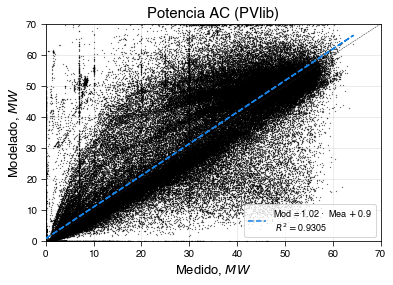

R2:  0.9305
RMSE:  11.89
MAPE:  19.93


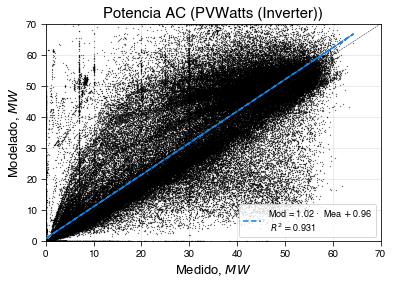

R2:  0.931
RMSE:  11.96
MAPE:  19.15


In [97]:
for model in ['PVlib', 'PVWatts (Inverter)']:
    #Least Squares Linear Regression
    x_value = elpasoDB.el_paso
    
    if model == 'PVlib':
        y_value = pvlib_ac/mega
    else:
        y_value = pvwatts_ac/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC ({model})',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

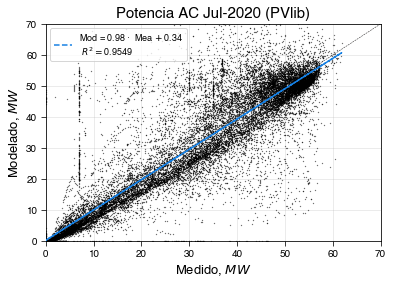

R2:  0.9549
RMSE:  9.91
MAPE:  13.93


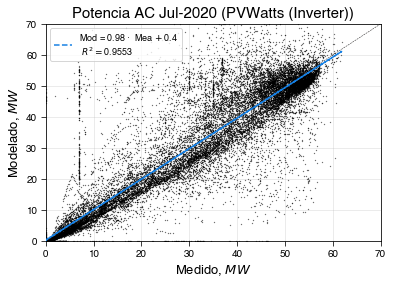

R2:  0.9553
RMSE:  9.9
MAPE:  13.32


In [98]:
for model in ['PVlib', 'PVWatts (Inverter)']:
    #Least Squares Linear Regression
    x_value = elpasoDB.el_paso[start:end]
    
    if model == 'PVlib':
        y_value = pvlib_ac[start:end]/mega
    else:
        y_value = pvwatts_ac[start:end]/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC Jul-2020 ({model})',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 13.1.2. Energía Diaria

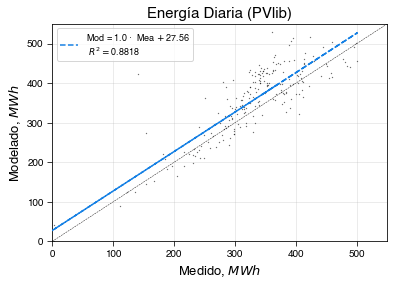

PVlib
R2:  0.8818
RMSE:  11.02
MAPE:  10.13




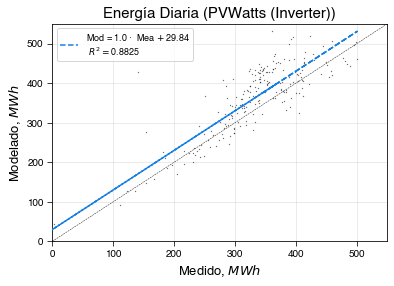

PVWatts (Inverter)
R2:  0.8825
RMSE:  11.36
MAPE:  9.9




In [99]:
for i in ['PVlib', 'PVWatts (Inverter)']:
    if i == 'PVlib':
        x_value = pvl_day_energy.measured
        y_value = pvl_day_energy.simulated
        ee = pvl_ee['day']
    
    else:
        x_value = pvw_day_energy.measured
        y_value = pvw_day_energy.simulated
        ee = pvw_ee['day']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 550

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Diaria ({i})',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(i)
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 13.1.3. Energía Semanal

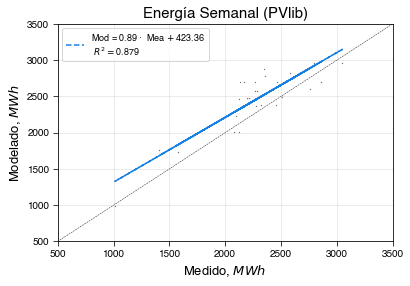

PVlib
R2:  0.879
RMSE:  8.96
MAPE:  8.81




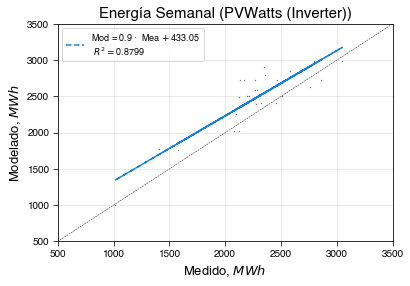

PVWatts (Inverter)
R2:  0.8799
RMSE:  9.48
MAPE:  9.6




In [100]:
for i in ['PVlib', 'PVWatts (Inverter)']:
    if i == 'PVlib':
        x_value = pvl_week_energy.measured
        y_value = pvl_week_energy.simulated
        ee = pvl_ee['week']
    
    else:
        x_value = pvw_week_energy.measured
        y_value = pvw_week_energy.simulated
        ee = pvw_ee['week']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 3500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Semanal ({i})',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=500, ylim_max=axis_lim, 
               xlim_min=500, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(i)
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 13.1.4. Energía Mensual <span style='color:White'>code:35</span>

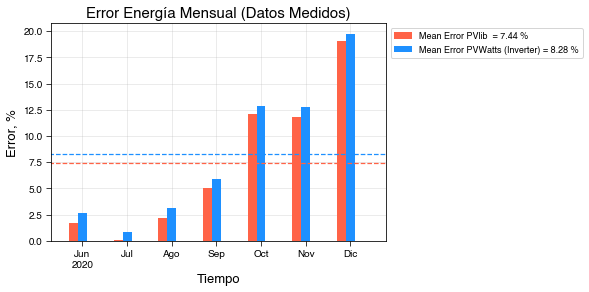

In [101]:
#Energy Error Comparison Plot
bar_width = 0.1
width = bar_width*2

months = ['Jun\n2020', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

x = np.arange(len(months))

r1 = np.arange(len(months))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

#Mean Error Values
pvlib_meanerror = round(pvl_ee['month']['perc_error'].mean(), 2)
pvwatts_meanerror = round(pvw_ee['month']['perc_error'].mean(), 2)

#Bar Plots
hor, ver = 13, 5
#plt.figure(figsize=(hor,ver))

plt.bar(r1, pvl_ee['month']['perc_error'], width, 
        label='Mean Error PVlib  = ' + f'{pvlib_meanerror}' + ' %', color='tomato', linewidth=2)

plt.bar(r3, pvw_ee['month']['perc_error'], width, 
        label='Mean Error PVWatts (Inverter) = ' + f'{pvwatts_meanerror}' + ' %', color='dodgerblue', linewidth=2)

#Horizontal Lines
plt.hlines(y=0, xmin=-1, xmax=x[-1]+1, colors='black', linestyles='solid', linewidth=0.5) #Zero
plt.hlines(y=pvlib_meanerror, xmin=-1, xmax=x[-1]+1, colors='tomato', linestyles='--', linewidth=1.25)
plt.hlines(y=pvwatts_meanerror, xmin=-1, xmax=x[-1]+1, colors='dodgerblue', linestyles='--', linewidth=1.25)

plt.xticks(r3, months)
plot_specs(title='Error Energía Mensual (Datos Medidos)',
           ylabel='Error, %',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=-0.5, xlim_max=7, 
           loc='best')
plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);

#### 13.1.5. Relación Recurso-Potencia
<span style='color:Crimson'> **Nota:** El ajuste lineal en las curvas tiene como función generar un apoyo visual a la tendencia del comportamiento de los datos. </span>

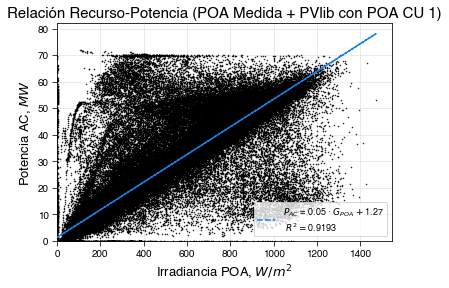

In [102]:
#Least Squares Linear Regression
y_value = pvlib_ac/mega
x_value = elpasoDB.poa1

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('$P_{AC}$ = ' + f'{slope.round(2)} $· \:$' + '$G_{POA}$ $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=1, fillstyle='none')

plot_specs(title=f'Relación Recurso-Potencia (POA Medida + PVlib con POA CU 1)',
           ylabel='Potencia AC, $MW$',
           xlabel='Irradiancia POA, $W/m^2$',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=0, xlim_max=None, 
           loc='lower right')

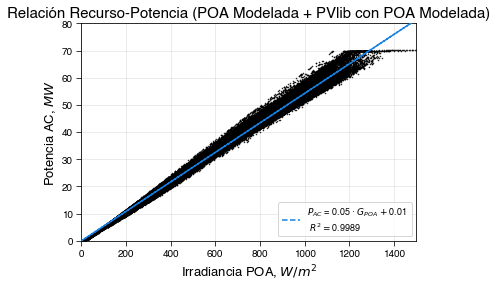

In [103]:
#Least Squares Linear Regression
y_value = pvlib_ac/mega
x_value = poa_effective.poa_global

df = pd.DataFrame({'x_val': x_value, 
                   'y_val': y_value})

df = df.dropna()

x_value = df.x_val
y_value = df.y_val

coef = np.polyfit(x_value, y_value, 1)
poly1d_fn = np.poly1d(coef)

slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

#Figure
plt.plot(x_value, 
         poly1d_fn(x_value), 
         '--k',
         label=('$P_{AC}$ = ' + f'{slope.round(2)} $· \:$' + '$G_{POA}$ $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
               + f'{r_value.round(4)}'), 
         color='#1580E4', linewidth=1.5, zorder = 10)

plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=1, fillstyle='none')

plot_specs(title=f'Relación Recurso-Potencia (POA Modelada + PVlib con POA Modelada)',
           ylabel='Potencia AC, $MW$',
           xlabel='Irradiancia POA, $W/m^2$',
           rot=0, 
           ylim_min=0, ylim_max=80, 
           xlim_min=0, xlim_max=1500, 
           loc='lower right')

### 13.2. Simulación Modelo (Resoluciones 5-, 10- y 60-min) <span style='color:White'>code:36</span>

In [104]:
#5-min
poa_effective_5min = poa_effective['poa_global'].copy()
poa_effective_5min = poa_effective_5min.resample('5Min').mean()


#10-min
poa_effective_10min = poa_effective['poa_global'].copy()
poa_effective_10min = poa_effective_10min.resample('10Min').mean()


#60-min (1-hor)
poa_effective_60min = poa_effective['poa_global'].copy()
poa_effective_60min = poa_effective_60min.resample('60Min').mean()

In [105]:
#5-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=poa_effective_5min, 
                           module_temperature=temp_cell_5)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_5 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_5, pvl_week_energy_5, pvl_month_energy_5, pvl_ee_5 = calc_energy(ac_sim=pvlib_ac_5, ac_mea=elpasoDB_5min.el_paso, res=5)

''''''

#10-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=poa_effective_10min, 
                           module_temperature=temp_cell_10)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_10 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_10, pvl_week_energy_10, pvl_month_energy_10, pvl_ee_10 = calc_energy(ac_sim=pvlib_ac_10, ac_mea=elpasoDB_10min.el_paso, res=10)

''''''

#60-min
#DC Production
dc_A, dc_B = dc_production(effective_irradiance=poa_effective_60min, 
                           module_temperature=temp_cell_60)

#Losses
dc_A, dc_B = losses(dc_A=dc_A, dc_B=dc_B, loss=26.9)

#AC Production
pvlib_ac_60 = pvlib_ac_power(dc_A=dc_A, dc_B=dc_B, total_inversores=4*12)

#Energy
pvl_day_energy_60, pvl_week_energy_60, pvl_month_energy_60, pvl_ee_60 = calc_energy(ac_sim=pvlib_ac_60, ac_mea=elpasoDB_60min.el_paso, res=60)


#### 13.2.1. Potencia AC

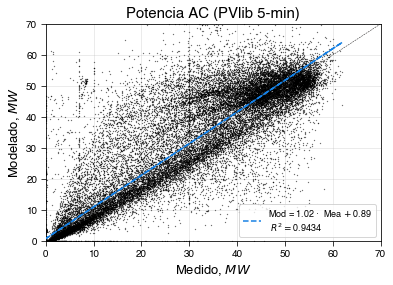

R2:  0.9434
RMSE:  11.06
MAPE:  18.1


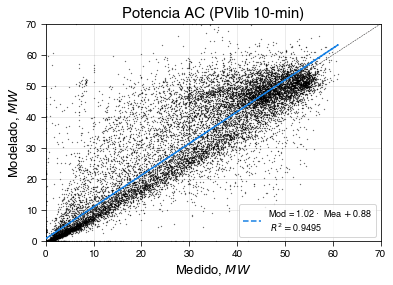

R2:  0.9495
RMSE:  10.57
MAPE:  17.04


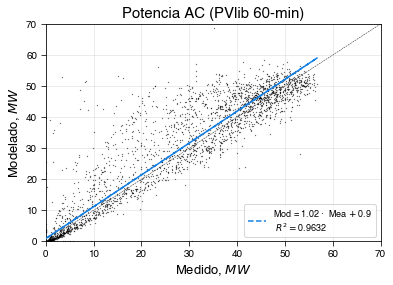

R2:  0.9632
RMSE:  9.6
MAPE:  13.47


In [106]:
for resolution in [5, 10, 60]:
    #Least Squares Linear Regression
    if resolution == 5:
        x_value = elpasoDB_5min.el_paso
        y_value = pvlib_ac_5/mega
    
    elif resolution == 10:
        x_value = elpasoDB_10min.el_paso
        y_value = pvlib_ac_10/mega
    
    else:
        x_value = elpasoDB_60min.el_paso
        y_value = pvlib_ac_60/mega

    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC (PVlib {resolution}-min)',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

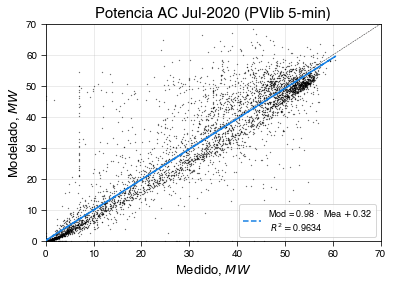

R2:  0.9634
RMSE:  9.06
MAPE:  13.07


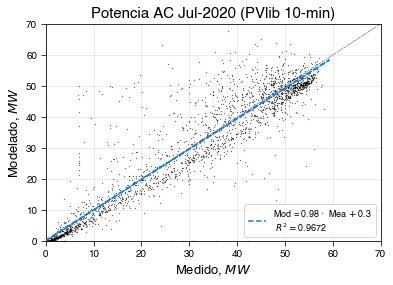

R2:  0.9672
RMSE:  8.73
MAPE:  12.99


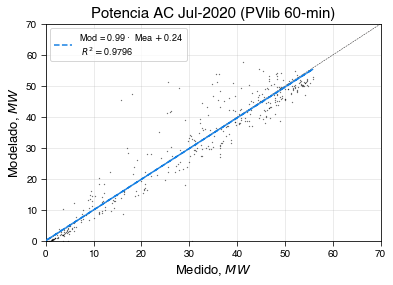

R2:  0.9796
RMSE:  7.13
MAPE:  9.52


In [107]:
for resolution in [5, 10, 60]:
    #Least Squares Linear Regression
    if resolution == 5:
        x_value = elpasoDB_5min.el_paso[start:end]
        y_value = pvlib_ac_5[start:end]/mega
    
    elif resolution == 10:
        x_value = elpasoDB_10min.el_paso[start:end]
        y_value = pvlib_ac_10[start:end]/mega
    
    else:
        x_value = elpasoDB_60min.el_paso[start:end]
        y_value = pvlib_ac_60[start:end]/mega
   
    ac = pd.DataFrame({'measured': x_value, 
                       'modeled': y_value})

    ac = ac.dropna()

    x_value = ac.measured
    y_value = ac.modeled

    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 70

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept
    
    plt.figure()
    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Potencia AC Jul-2020 (PVlib {resolution}-min)',
               ylabel='Modelado, $MW$',
               xlabel='Medido, $MW$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')

    plt.show()
    
    #Metrics
    metrics(r2=r_value, measured=x_value, modeled=y_value, store=False)

#### 13.2.2. Energía Diaria

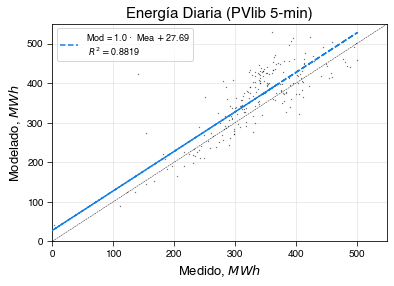

Res 5-min
R2:  0.8819
RMSE:  11.06
MAPE:  10.26




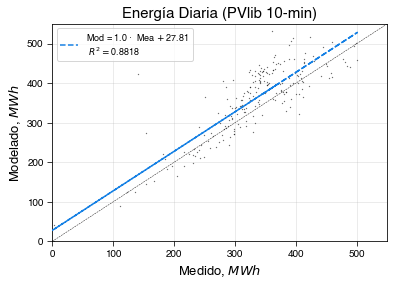

Res 10-min
R2:  0.8818
RMSE:  11.1
MAPE:  10.28




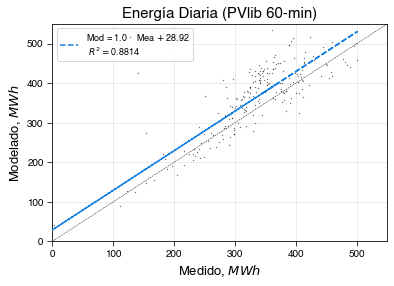

Res 60-min
R2:  0.8814
RMSE:  11.32
MAPE:  10.53




In [108]:
for i in [5, 10, 60]:
    if i == 5:
        x_value = pvl_day_energy_5.measured
        y_value = pvl_day_energy_5.simulated
        ee = pvl_ee_5['day']
    
    elif i == 10:
        x_value = pvl_day_energy_10.measured
        y_value = pvl_day_energy_10.simulated
        ee = pvl_ee_10['day']
    
    else:
        x_value = pvl_day_energy_60.measured
        y_value = pvl_day_energy_60.simulated
        ee = pvl_ee_60['day']
        
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 550

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Diaria (PVlib {i}-min)',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=0, ylim_max=axis_lim, 
               xlim_min=0, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(f'Res {i}-min')
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 13.2.3. Energía Semanal

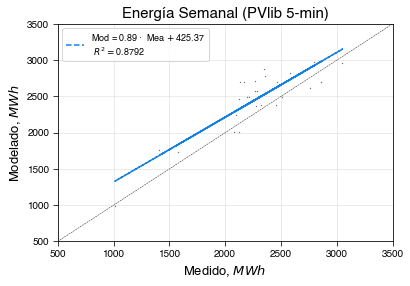

Res 5-min
R2:  0.8792
RMSE:  9.02
MAPE:  8.89




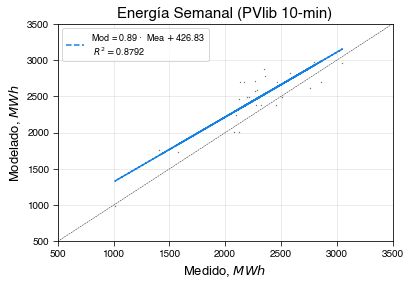

Res 10-min
R2:  0.8792
RMSE:  9.06
MAPE:  8.91




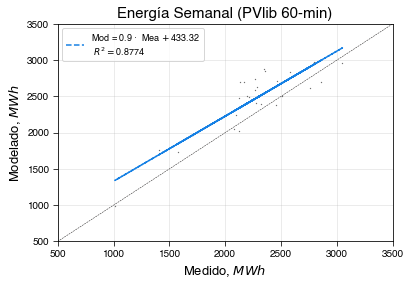

Res 60-min
R2:  0.8774
RMSE:  9.41
MAPE:  9.11




In [109]:
for i in [5, 10, 60]:
    if i == 5:
        x_value = pvl_week_energy_5.measured
        y_value = pvl_week_energy_5.simulated
        ee = pvl_ee_5['week']
    
    elif i == 10:
        x_value = pvl_week_energy_10.measured
        y_value = pvl_week_energy_10.simulated
        ee = pvl_ee_10['week']
    
    else:
        x_value = pvl_week_energy_60.measured
        y_value = pvl_week_energy_60.simulated
        ee = pvl_ee_60['week']
    
    #Figure
    plt.figure()

    #Least Squares Linear Regression
    coef = np.polyfit(x_value, y_value, 1)
    poly1d_fn = np.poly1d(coef)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x_value, y_value)

    #Figure
    axis_lim = 3500

    x = np.linspace(0, axis_lim, axis_lim)
    y_reg = slope*x + intercept

    plt.plot(x_value, 
             poly1d_fn(x_value), 
             '--k',
             label=('Mod = ' + f'{slope.round(2)} $· \:$ Mea $+ \:$' + f'{intercept.round(2)} \n $R^2 = $' 
                   + f'{r_value.round(4)}'), 
             color='#1580E4', linewidth=1.5, zorder = 10)

    plt.plot(x_value, y_value, color='black', ls='', marker='.', ms=0.5, fillstyle='none')

    y = x
    plt.plot(x, y, '--', color='#222020', linewidth=0.5)

    plot_specs(title=f'Energía Semanal (PVlib {i}-min)',
               ylabel='Modelado, $MWh$',
               xlabel='Medido, $MWh$',
               rot=0, 
               ylim_min=500, ylim_max=axis_lim, 
               xlim_min=500, xlim_max=axis_lim, 
               loc='best')
    
    plt.show()
    
    #Metrics
    print(f'Res {i}-min')
    print('R2: ', r_value.round(4))

    metrics_data = pd.DataFrame({'effective_irrad': x_value, 
                                 'poa': y_value})

    y_true = metrics_data.effective_irrad
    y_pred = metrics_data.poa

    rmse = mean_squared_error(y_true=y_true, y_pred=y_pred, squared=False)
    rmse = (rmse/np.max(y_true))*100
    print('RMSE: ', np.round(rmse, 2))

    '''
    MAPE requiere filtrar los datos cuando y_true=0 --> (y_true - y_pred)/y_true
    '''
    ee = ee.loc[ee.energy != 0]

    print('MAPE: ', np.round(ee['perc_error'].median(), 2))
    print('\n')

#### 13.2.4. Energía Mensual <span style='color:White'>code:37</span>

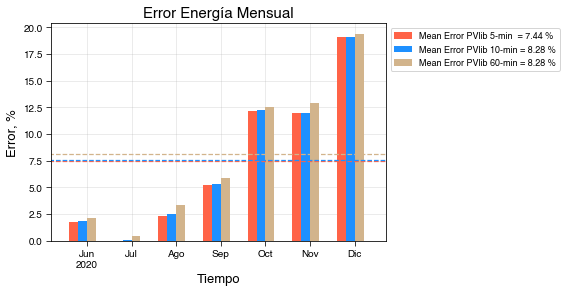

In [110]:
#Energy Error Comparison Plot
bar_width = 0.1
width = bar_width*2

months = ['Jun\n2020', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

x = np.arange(len(months))

r1 = np.arange(len(months))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
r4 = [x + bar_width for x in r3]
r5 = [x + bar_width for x in r4]

#Mean Error Values
pvlib_meanerror_5 = round(pvl_ee_5['month']['perc_error'].mean(), 2)
pvlib_meanerror_10 = round(pvl_ee_10['month']['perc_error'].mean(), 2)
pvlib_meanerror_60 = round(pvl_ee_60['month']['perc_error'].mean(), 2)

#Bar Plots
hor, ver = 13, 5
#plt.figure(figsize=(hor,ver))

plt.bar(r1, pvl_ee_5['month']['perc_error'], width, 
        label='Mean Error PVlib 5-min  = ' + f'{pvlib_meanerror}' + ' %', color='tomato', linewidth=2)

plt.bar(r3, pvl_ee_10['month']['perc_error'], width, 
        label='Mean Error PVlib 10-min = ' + f'{pvwatts_meanerror}' + ' %', color='dodgerblue', linewidth=2)

plt.bar(r5, pvl_ee_60['month']['perc_error'], width, 
        label='Mean Error PVlib 60-min = ' + f'{pvwatts_meanerror}' + ' %', color='tan', linewidth=2)

#Horizontal Lines
plt.hlines(y=0, xmin=-1, xmax=x[-1]+1, colors='black', linestyles='solid', linewidth=0.5) #Zero
plt.hlines(y=pvlib_meanerror_5, xmin=-1, xmax=x[-1]+1, colors='tomato', linestyles='--', linewidth=1.25)
plt.hlines(y=pvlib_meanerror_10, xmin=-1, xmax=x[-1]+1, colors='dodgerblue', linestyles='--', linewidth=1.25)
plt.hlines(y=pvlib_meanerror_60, xmin=-1, xmax=x[-1]+1, colors='tan', linestyles='--', linewidth=1.25)

plt.xticks(r4, months)
plot_specs(title='Error Energía Mensual',
           ylabel='Error, %',
           xlabel='Tiempo',
           rot=0, 
           ylim_min=0, ylim_max=None, 
           xlim_min=-0.5, xlim_max=7, 
           loc='best')
plt.legend(loc='best', bbox_to_anchor=(1,1), fontsize=9);

---

## 14. Conclusiones

En el presente cuaderno se implementan las metodologías propuestas para el Alcance 1 y 3 del Convenio Específico 5:

   - **Alcance 1:** Se emplean los **<span style='outline:2px solid Orange; color:Peru'>modelos de descomposición (DISC) y transposición (Perez-Ineichen 1990)</span>** para estimar y modelar la Irradiancia Normal Directa (Direct Normal Irradiance – DNI), la Irradiancia Horizontal Difusa (Diffuse Horizontal Irradiance – DHI) y la irradiancia sobre el plano del arreglo (Plane Of the Array-POA) a partir de la Irradiancia Horizontal Global (Global Horizontal Irradiance – GHI). Otros modelos de descomposición (Erbs, DIRINT y DIRINDEX) y transposición (Isotrópico, Klucher 1979, Reindl 1990, King y Hay-Davies 1980) se evalúan para verificar la validez de los modelos propuestos. <br><br>
    
   - **Alcance 3:** Se emplea el **<span style='outline:2px solid Orange; color:Peru'>modelo propuesto en PVlib a partir de los algoritmos desarrollados por *Sandia Array Performance Model* (SAPM)</span>** para el modelado computacional que estima la producción de una planta solar fotovoltaica a partir de los parámetros técnicos de la planta (configuración, tecnologías, tipo de seguimiento, entre otros aspectos), la irradiancia y otras variables meteorológicas. También, en aras de verificar la validez del modelo propuesto, se comparan los resultados con los obtenidos del modelo del inversor de PVWatts.

Las metodologías se validan frente a datos monitoreados con resolución minutal de la producción del sistema de 86.16 MWp del Parque Solar Fotovoltaico El Paso de Enel Green Power. Con las novedades en cuanto a las pruebas de escritorio de:

1. Planta fotovoltaica de escala utility.
2. Resolución minutal de los datos.
3. Incorporación de seguidores en el modelado computacional.

La precisión del modelado se estima a partir de métricas estadísticas descriptivas tales como: (i.) coeficiente de correlación (R$^2$), raíz del error cuadrático medio (RMSE, por sus siglas en inglés) y mediana del error absoluto porcentual (MAPE, por sus siglas en inglés).

Las principales conclusiones son:

> La irradiancia en el plano de arreglo (POA) reporta el menor error porcentual (MAPE) para los subcampos CU 1, 2, 3 y 4 (9.73% para los dos primeros y 11.08% para los dos últimos). Esto sugiere que la estación meteorológica se ubica próxima a estos subcampos y la irradiancia captada es representativa en mayor medida para su modelado. Para los demás subcampos el error porcentual aumenta hasta un máximo de 20.79% para CU 5, 6 y 7. Por otra parte, los datos de Julio-2020 se identificaron como más confiables y de mayor calidad; el error porcentual para CU 1 es 6.46%.

> La correlación entre la medición y modelado (DISC) de la irradiancia horizontal difusa (DHI) presenta un error porcentual (MAPE) de 27.13% pero con la identificación de inconsistencias en los datos medidos reportados. El ejericio a partir de datos de año típico meteorológico (TMY) extraídos para el año 2020 en la misma ubicación mediante el *National Solar Radiation Database* (NSRDB) reporta un error porcentual de 10.47%.

> Otros modelos de descomposición junto con el modelo de transposición Perez-Ineichen 1990 presentan un mayor error frente a la metodología propuesta. El más próximo es Erbs + Perez-Ineichen 1990 con un MAPE de 9.68%, i.e. 0.05 puntos porcentuales menor frente al propuesto. 

> El mejor coeficiente de correlación para la irradiancia POA se obtiene con el modelo propuesto (DISC + Perez-Ineichen 1990) con un valor de 0.932.

> El resampleo de los datos minutales a resoluciones 5-, 10- y 60-minutal reduce notoriamente la dispersión pero el error se incrementa levemente a causa de los procedimientos matemáticos que añaden incertidumbre (9.73, 10.17, 10.4 y 14.35% para la irradiancia POA con resoluciones 1-, 5-, 10- y 60-min, respectivamente).

> El modelado de la producción mediante PVlib con datos medidos arroja errores porcentuales (MAPE) de 14.54, 9.07, 6.81 y 5.36% para la Potencia AC, Energía Diaria, Energía Semanal y Energía Mensual, respectivamente. Para la Potencia AC de Jul-2020, el error reportado es de 11.49%. Por otra parte, para la Energía Mensual, el MAPE mínimo es de 0.48% para Sep-2020 y el MAPE máximo es de 14.38% para Dic-2020.

> El resampleo de los datos minutales a resoluciones 5-, 10- y 60-minutal reduce la dispersión de las simulaciones de producción mediante PVlib. Para el caso de la Potencia AC, el error es de 13.41, 12.77 y 10.97%, respectivamente (error mínimo de 8.68% para Jul-2020 con resolución 60-min). Para la Energía Diaria se tienen MAPE promedio de 8.83% para las resoluciones estudiadas (mínimo de 8.68% para resolución 60-min), y de 6.87% (mínimo de 6.7% para resolución 60-min) para la Energía Semanal. Finalmente, el MAPE mínimo para la Energía Mensual es de 5.3% para la resolución 60-min.

> El modelado de la producción mediante PVlib con los datos de irradiancia POA obtenidos por la metodología propuesta (DISC + Perez-Ineichen 1990) son alrededor de 5 puntos porcentuales mayor frente a los datos medidos; esto a causa de los procedimientos matemáticos que añaden incertidumbre. Específicamente, los MAPE obtenidos son 19.15, 10.13, 8.81 y 7.44% para la Potencia AC (13.93% en Jul-2020), Energía Diaria, Energía Semanal y Energía Mensual, respectivamente. Esto representa una desviación de 2.43 puntos porcentuales frente a los datos medidos. Finalmente, para la Energía Mensual, el MAPE mínimo es de 0.1% para Jul-2020 y el MAPE máximo es de 19.07% para Dic-2020.

> Equivalente al ejercicio con los datos medidos, el resampleo de los datos minutales reduce la dispersión de las simulaciones. El MAPE para la Potencia AC con resoluciones 5-, 10- y 60-minutal, es: 13.07, 12.99 y 9.52%, respectivamente. El MAPE mínimo para la Energía Diaria y Energía Semanal es 10.26% (resolución 5-min) y 8.89% (resolución 5-min), respectivamente. Por último, la Energía Mensual mínima es de 7.44% y se obtiene con la resolución 5-min.

---